In [150]:
import pandas as pd 
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import savgol_filter
from sklearn.metrics import mean_squared_error , mean_absolute_error,r2_score
from sklearn.preprocessing import StandardScaler ,RobustScaler 
from sklearn.model_selection import GridSearchCV


# data reading and data preparation

In [151]:
df=pd.read_csv('jordan_temp_monthly.csv')
df.head()

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
0,1901,7.31,12.75,15.53,17.75,19.61,24.21,26.30,26.23,23.76,20.22,14.18,10.85
1,1902,7.62,12.14,11.55,16.75,21.23,23.14,25.93,25.85,25.53,20.86,13.59,8.89
2,1903,6.68,7.98,10.71,16.97,21.44,22.71,24.41,25.33,22.57,18.61,12.73,9.91
3,1904,7.97,10.34,12.51,15.90,20.01,23.15,25.28,25.83,23.67,21.32,13.48,8.04
4,1905,6.14,6.97,10.80,17.10,21.65,23.74,26.71,26.67,25.02,21.52,16.07,8.51


In [152]:
jor_temp_df=pd.read_csv('jordan_temp_annual.csv')
jor_temp_df.head()


,Year,Jordan,Ajloon,Balqa,Aqaba,Karak,Amman,Tafiela,Irbid,Jarash,Ma'an,Madaba,Mafraq,Zarqa
0,1901,18.25,18.17,18.15,18.98,17.50,17.68,17.32,18.55,18.17,18.54,18.05,18.02,18.46
1,1902,17.78,17.67,17.65,18.50,17.01,17.18,16.84,18.04,17.67,18.05,17.55,17.58,17.96
2,1903,16.72,16.64,16.61,17.46,15.96,16.14,15.79,17.02,16.64,17.02,16.51,16.48,16.92
3,1904,17.31,17.23,17.21,18.07,16.57,16.72,16.40,17.61,17.23,17.61,17.12,17.05,17.49
4,1905,17.63,17.55,17.53,18.45,16.90,17.06,16.73,17.91,17.55,17.97,17.43,17.31,17.81


In [153]:
co2_df=pd.read_csv('jordan_co2_emissions.csv')
co2_df['co2_diff']=co2_df['CO2 Emissions'].diff()
co2_df['co2_prc']=co2_df['co2_diff'].pct_change()
co2_df.head()

,Year,CO2 Emissions,co2_diff,co2_prc
0,1950,172208.0,NaN,NaN
1,1951,333424.0,161216.0,NaN
2,1952,527616.0,194192.0,0.204545
3,1953,740128.0,212512.0,0.094340
4,1954,992677.0,252549.0,0.188399


In [154]:
land_df=pd.read_csv('climate-change_jor.csv')
land_df=land_df[land_df['Indicator Name']=='Agricultural land (sq. km)'].drop(['Country Name','Country ISO3','Indicator Name','Indicator Code'],axis=1)
land_df.head()

,Year,Value
0,2020,10290.0
1,2019,10365.0
2,2018,10218.0
3,2017,10070.0
4,2016,10659.6


In [155]:
rain_df=pd.read_csv('pr_timeseries_monthly_cru_1901-2021_JOR.csv')
rain_df.head()

,Year,Jan,Feb,Mar,Apr,May,Jun,Jul,Aug,Sep,Oct,Nov,Dec
0,1901,31.91,3.56,7.99,4.93,16.20,0.09,0.07,0.07,0.03,2.61,10.35,22.80
1,1902,38.02,10.77,13.56,12.99,1.82,0.09,0.07,0.07,0.03,4.57,27.11,24.72
2,1903,26.50,21.47,19.78,3.98,1.15,0.10,0.07,0.07,0.03,1.99,9.87,14.66
3,1904,33.70,15.50,22.84,11.68,2.90,0.10,0.07,0.07,0.03,5.82,20.85,48.28
4,1905,20.72,26.72,33.62,12.97,3.26,0.13,0.07,0.07,0.08,5.22,4.31,44.39


# data smoothing technics 


In [156]:
# data smoothing function 
def take_range(data,column,step):
    new_temps=[]
    new_years=[]
    for i in range(0,len(data)-step,step):
        tot=0
        for j in range(i,i+step,1):
            tot+=data[column][j]
        new_temps.append(tot/step)
        # new_years.append(f"{data['Year'][i]}-{data['Year'][j]}")
        new_years.append(data['Year'][i])

    return pd.DataFrame({'year':new_years,'value':new_temps})

# savgol_filter function was better 

In [157]:
def data_smother_visualizer(data_rame,wanted_col):
    new_data=savgol_filter(data_rame[wanted_col],10,1)
    newdata_rame=pd.DataFrame({'year':data_rame['Year'],'value':new_data})
    print(wanted_col)
    print(newdata_rame)
    print(f"dalta value= {newdata_rame['value'][len(newdata_rame)-1]-newdata_rame['value'][0]}")

    fig, ax1 = plt.subplots(figsize=(8,4))

    plot1=ax1.plot(newdata_rame['year'],newdata_rame['value'], color='tab:blue',label="Smothed data")
    ax1.set_ylabel('smothed data')  
    plt.grid()

    ax2 = ax1.twinx()
    ax2.set_ylabel('original data')  
    plot2=ax2.plot(data_rame['Year'],data_rame[wanted_col], color='tab:red',alpha=0.5,label="Original data")

    fig.tight_layout()
    plt.title(wanted_col)
    lns = plot1+plot2
    labs = [l.get_label() for l in lns]
    ax1.legend(lns, labs, loc=0)
    plt.show()
    
    data_rame['annual_change']=data_rame[wanted_col].pct_change()
    fig, ax = plt.subplots(figsize=(8,4))
    print(f"average annual change percentage = {data_rame['annual_change'].mean()*100}%")

    ax.plot(data_rame['Year'],data_rame['annual_change']*100,label='annual change percentage')

    ax.axhline(y=0, lw=1, color='k',alpha=1)
    ax.axhline(y=data_rame['annual_change'].mean()*100, lw=1, color='blue',alpha=.8)

    plt.title(f"annual change percentage {wanted_col}")
    plt.grid()
    plt.show()
    data_rame[f'{wanted_col} smoothed']=new_data

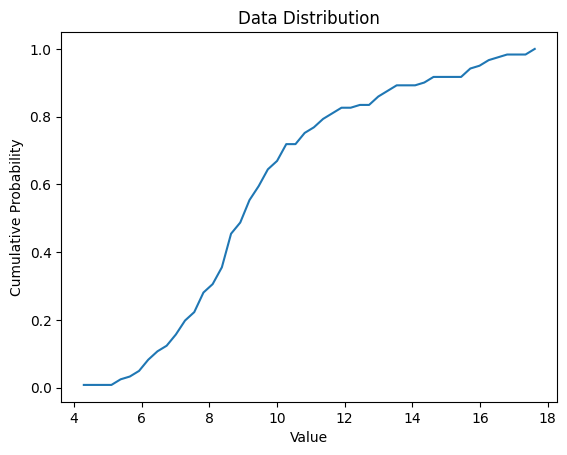

In [187]:
import matplotlib.pyplot as plt
import numpy as np

# Generate some random data
data = rain_df['Apr']

# Compute the histogram of the data
counts, bin_edges = np.histogram(data, bins=50)

# Compute the cumulative distribution function
cdf = np.cumsum(counts) / len(data)

# Plot the CDF as a line plot
plt.plot(bin_edges[1:], cdf)
plt.title('Data Distribution')
plt.xlabel('Value')
plt.ylabel('Cumulative Probability')
plt.show()


# data vis

## visualizing the temperature for each month before and after smoothing

Jan
     year     value
0    1901  7.131273
1    1902  7.199879
2    1903  7.268485
3    1904  7.337091
4    1905  7.405697
..    ...       ...
116  2017  9.372364
117  2018  9.443091
118  2019  9.513818
119  2020  9.584545
120  2021  9.655273

[121 rows x 2 columns]
dalta value= 2.5239999999999956


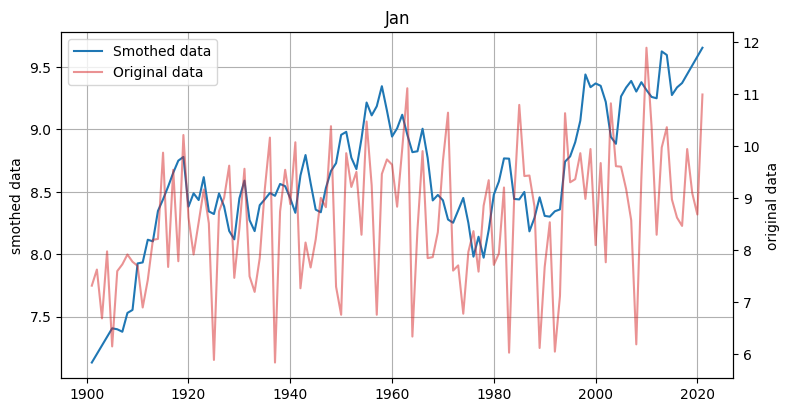

annual change percentage = 2.3273156680330622%


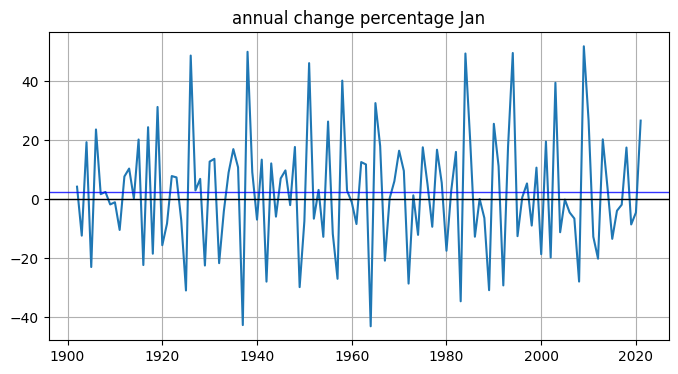

Feb
     year      value
0    1901  10.751091
1    1902  10.546848
2    1903  10.342606
3    1904  10.138364
4    1905   9.934121
..    ...        ...
116  2017  11.596909
117  2018  11.652727
118  2019  11.708545
119  2020  11.764364
120  2021  11.820182

[121 rows x 2 columns]
dalta value= 1.0690909090909049


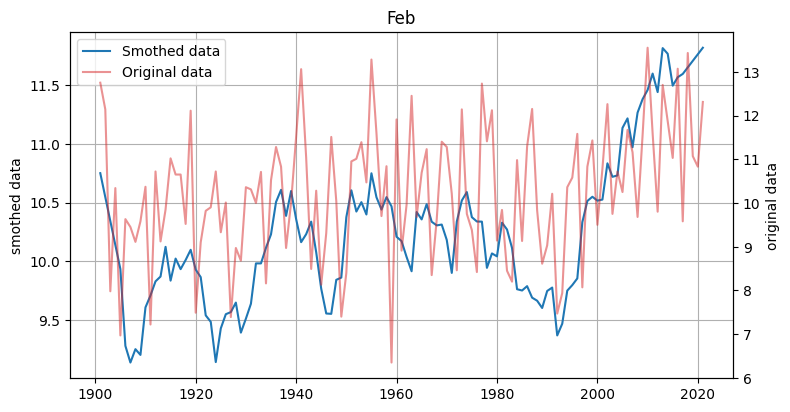

annual change percentage = 2.0943098371055036%


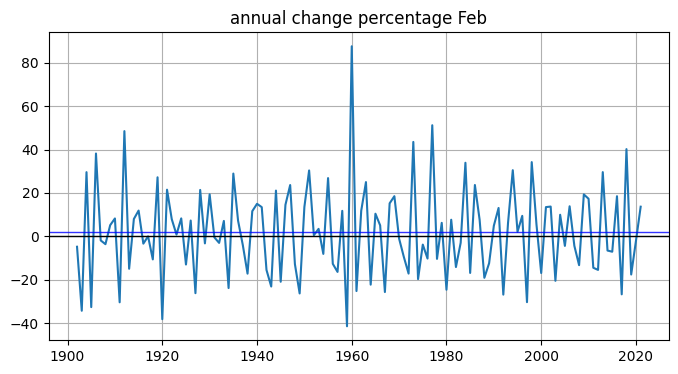

Mar
     year      value
0    1901  12.816182
1    1902  12.655030
2    1903  12.493879
3    1904  12.332727
4    1905  12.171576
..    ...        ...
116  2017  14.915152
117  2018  14.909455
118  2019  14.903758
119  2020  14.898061
120  2021  14.892364

[121 rows x 2 columns]
dalta value= 2.0761818181818175


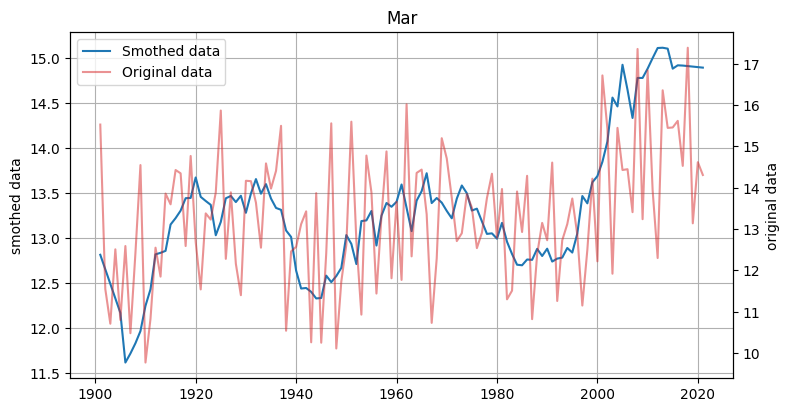

annual change percentage = 1.3036365350017085%


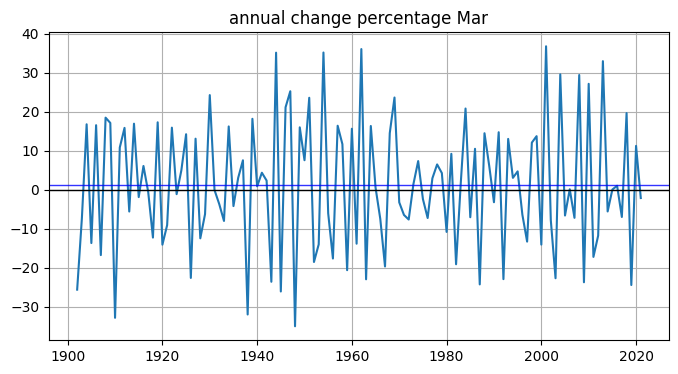

Apr
     year      value
0    1901  16.995273
1    1902  16.949212
2    1903  16.903152
3    1904  16.857091
4    1905  16.811030
..    ...        ...
116  2017  19.262424
117  2018  19.177273
118  2019  19.092121
119  2020  19.006970
120  2021  18.921818

[121 rows x 2 columns]
dalta value= 1.9265454545454546


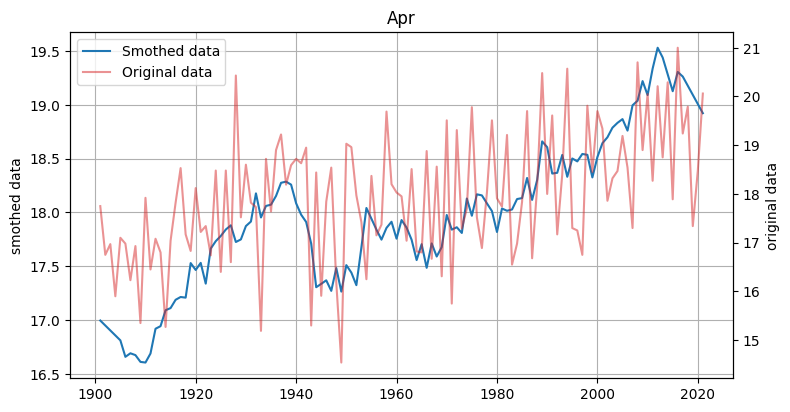

annual change percentage = 0.6116110257743854%


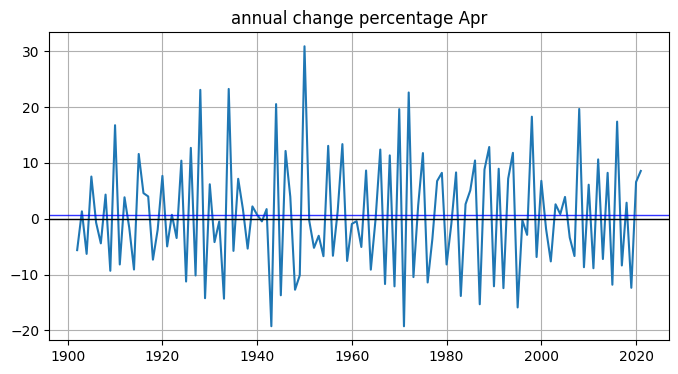

May
     year      value
0    1901  20.159091
1    1902  20.404848
2    1903  20.650606
3    1904  20.896364
4    1905  21.142121
..    ...        ...
116  2017  24.013939
117  2018  24.103818
118  2019  24.193697
119  2020  24.283576
120  2021  24.373455

[121 rows x 2 columns]
dalta value= 4.2143636363636325


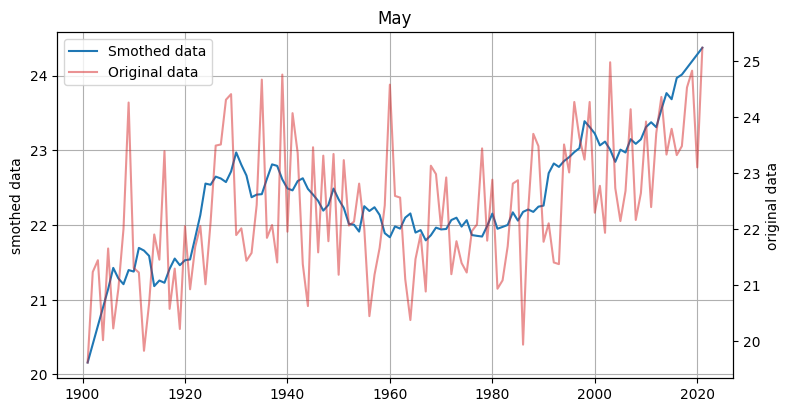

annual change percentage = 0.4114069261767948%


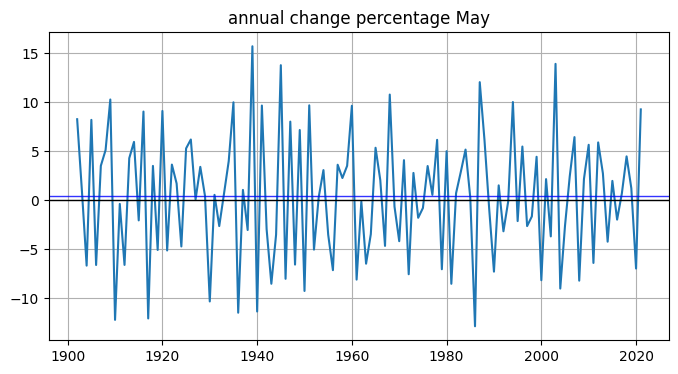

Jun
     year      value
0    1901  23.320727
1    1902  23.430121
2    1903  23.539515
3    1904  23.648909
4    1905  23.758303
..    ...        ...
116  2017  26.400121
117  2018  26.370364
118  2019  26.340606
119  2020  26.310848
120  2021  26.281091

[121 rows x 2 columns]
dalta value= 2.9603636363636383


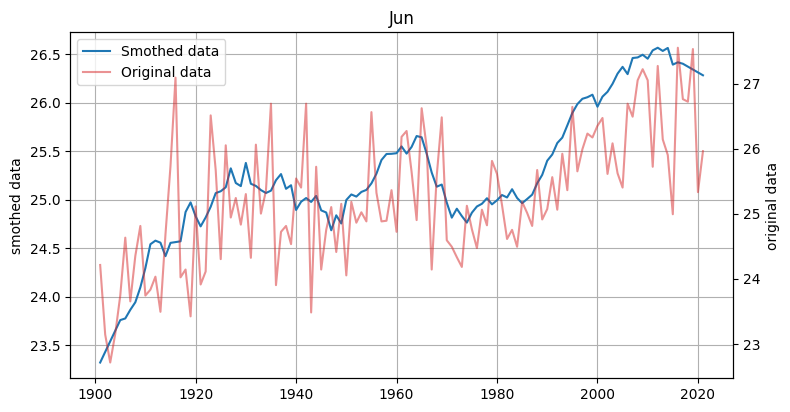

annual change percentage = 0.1433076267314361%


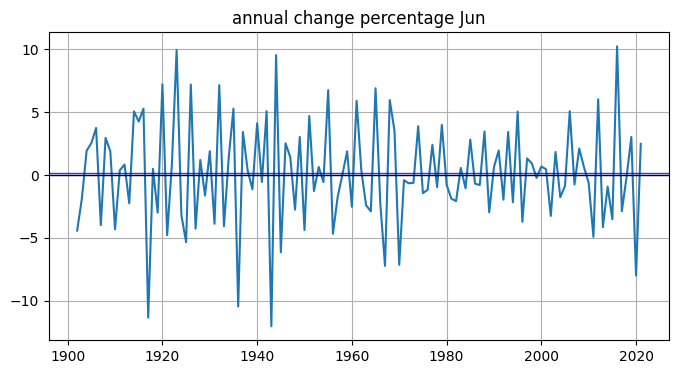

Jul
     year      value
0    1901  25.533455
1    1902  25.650242
2    1903  25.767030
3    1904  25.883818
4    1905  26.000606
..    ...        ...
116  2017  28.794061
117  2018  28.848182
118  2019  28.902303
119  2020  28.956424
120  2021  29.010545

[121 rows x 2 columns]
dalta value= 3.477090909090908


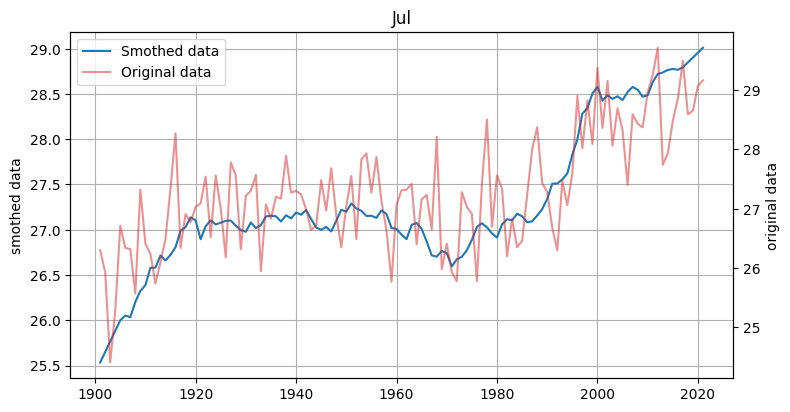

annual change percentage = 0.13386730495539473%


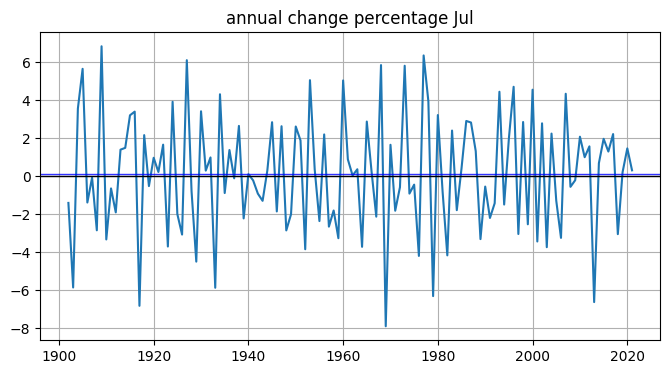

Aug
     year      value
0    1901  25.743455
1    1902  25.860242
2    1903  25.977030
3    1904  26.093818
4    1905  26.210606
..    ...        ...
116  2017  28.850182
117  2018  28.844545
118  2019  28.838909
119  2020  28.833273
120  2021  28.827636

[121 rows x 2 columns]
dalta value= 3.0841818181818184


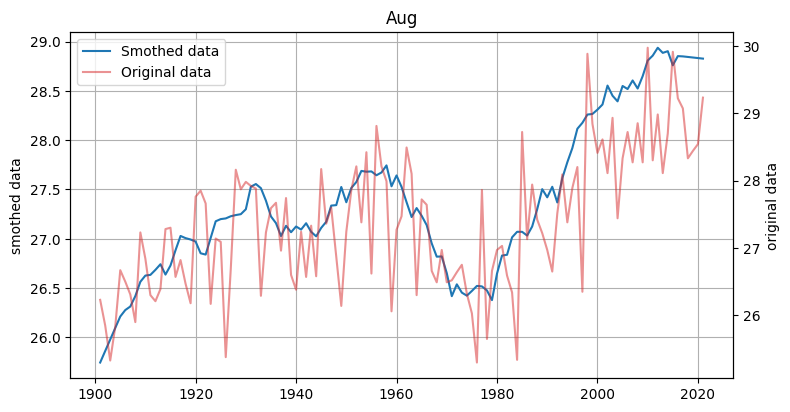

annual change percentage = 0.15760378038450742%


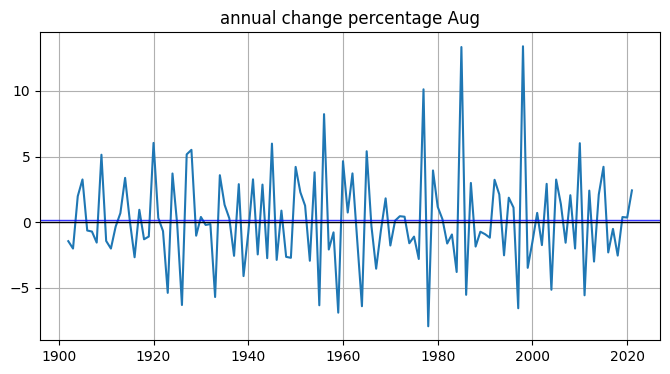

Sep
     year      value
0    1901  23.947091
1    1902  23.967515
2    1903  23.987939
3    1904  24.008364
4    1905  24.028788
..    ...        ...
116  2017  26.669818
117  2018  26.727455
118  2019  26.785091
119  2020  26.842727
120  2021  26.900364

[121 rows x 2 columns]
dalta value= 2.953272727272722


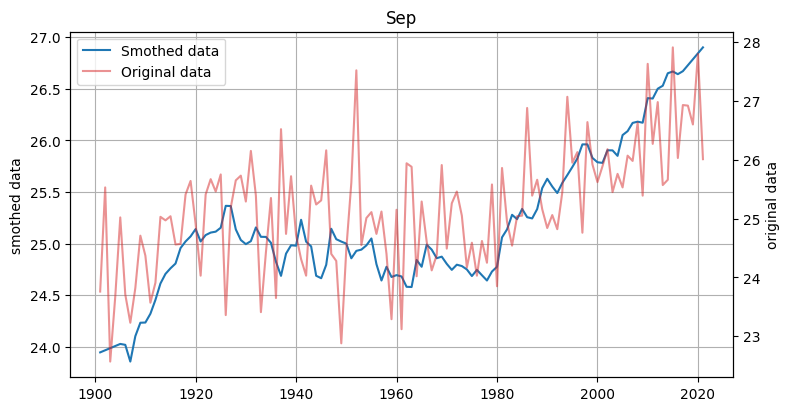

annual change percentage = 0.18492388433205598%


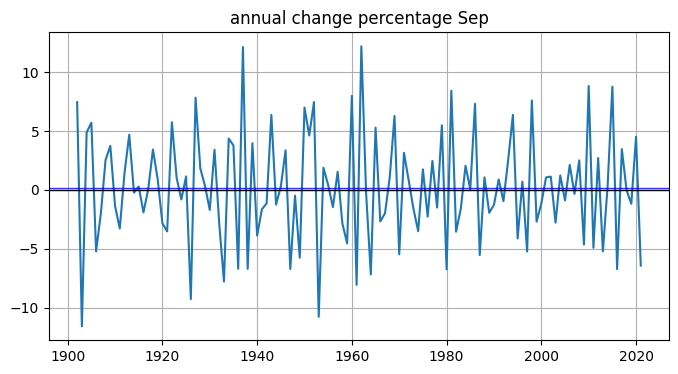

Oct
     year      value
0    1901  20.575091
1    1902  20.491515
2    1903  20.407939
3    1904  20.324364
4    1905  20.240788
..    ...        ...
116  2017  22.168061
117  2018  22.316182
118  2019  22.464303
119  2020  22.612424
120  2021  22.760545

[121 rows x 2 columns]
dalta value= 2.1854545454545438


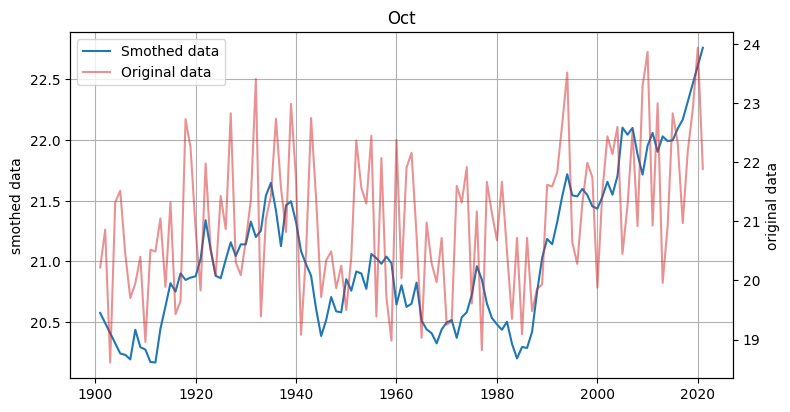

annual change percentage = 0.3380673226060076%


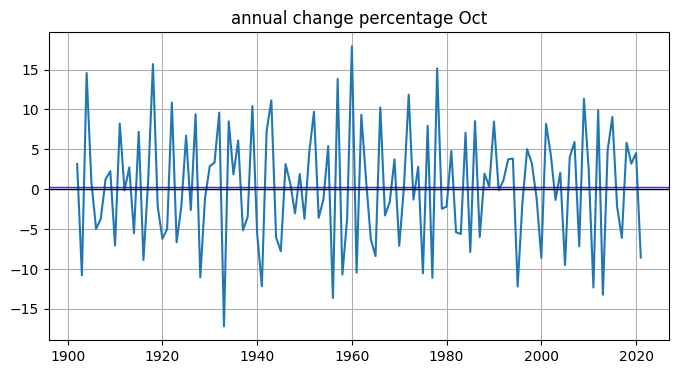

Nov
     year      value
0    1901  13.769636
1    1902  13.827273
2    1903  13.884909
3    1904  13.942545
4    1905  14.000182
..    ...        ...
116  2017  16.310485
117  2018  16.297455
118  2019  16.284424
119  2020  16.271394
120  2021  16.258364

[121 rows x 2 columns]
dalta value= 2.4887272727272745


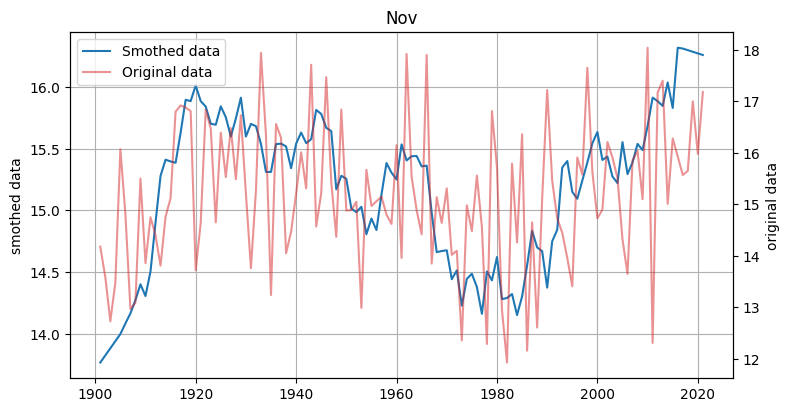

annual change percentage = 0.9490005419598744%


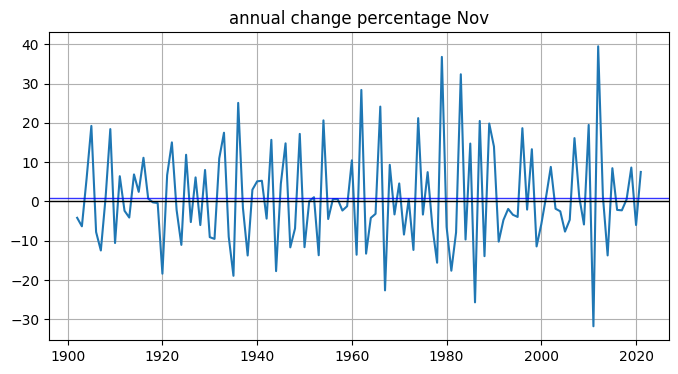

Dec
     year      value
0    1901   9.646545
1    1902   9.623091
2    1903   9.599636
3    1904   9.576182
4    1905   9.552727
..    ...        ...
116  2017  11.371455
117  2018  11.474364
118  2019  11.577273
119  2020  11.680182
120  2021  11.783091

[121 rows x 2 columns]
dalta value= 2.136545454545457


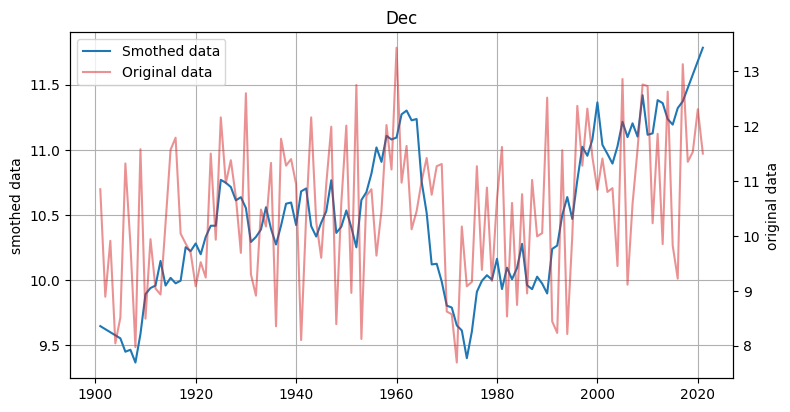

annual change percentage = 1.7439994705663806%


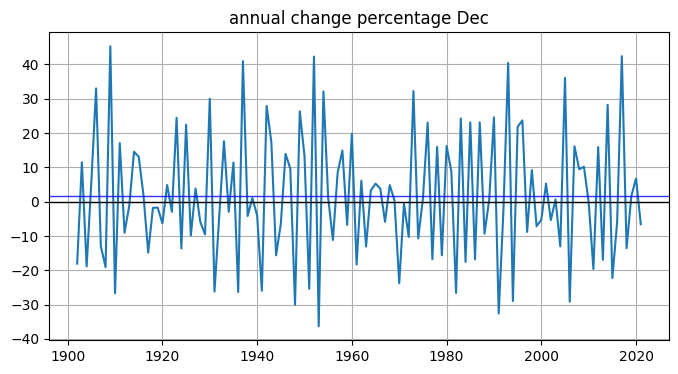

In [158]:
monthss=df.columns[1:]
for wanted_month in monthss:    
    data_smother_visualizer(df,wanted_month)

    

## the temps for all months in one chart

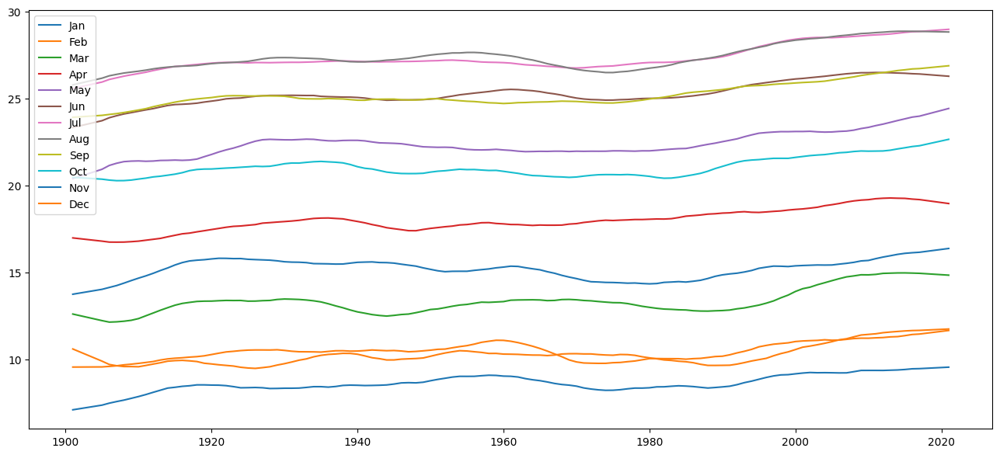

In [159]:
plt.figure(figsize=(16,7))
for wanted_month in monthss:    
    new_data=savgol_filter(df[wanted_month],10,1)
    newdf=pd.DataFrame({'year':df['Year'],'temp':new_data})
    plt.plot(newdf['year'],newdf['temp'],label=wanted_month)
plt.legend(loc='upper left')
plt.show()

## visualizing the temperature for each governates before and after smoothing

Jordan
     year      value
0    1901  17.562364
1    1902  17.582061
2    1903  17.601758
3    1904  17.621455
4    1905  17.641152
..    ...        ...
116  2017  20.014848
117  2018  20.052545
118  2019  20.090242
119  2020  20.127939
120  2021  20.165636

[121 rows x 2 columns]
dalta value= 2.6032727272727243


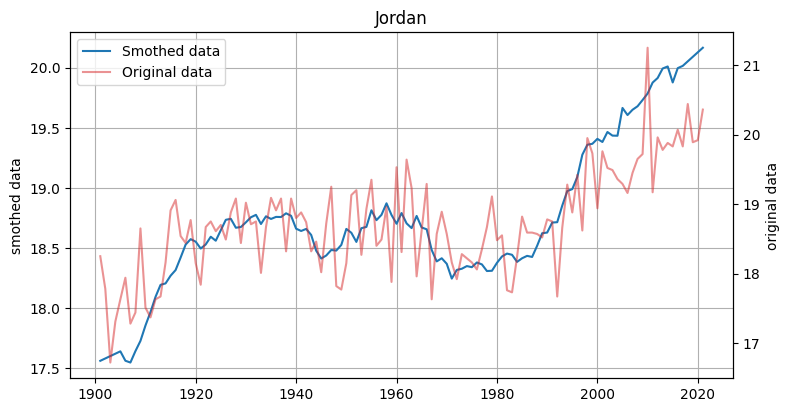

annual change percentage = 0.14959693662653467%


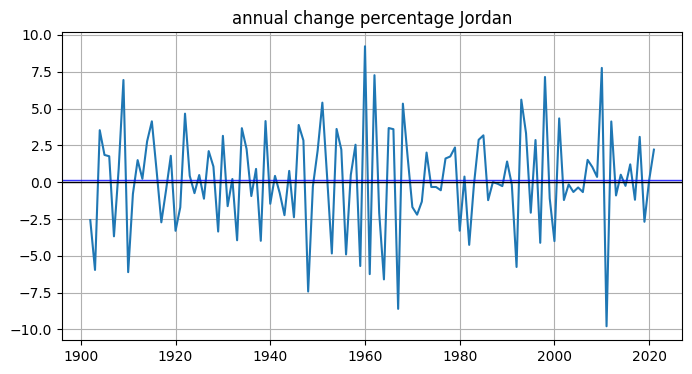

Ajloon
     year      value
0    1901  17.478727
1    1902  17.495455
2    1903  17.512182
3    1904  17.528909
4    1905  17.545636
..    ...        ...
116  2017  19.943333
117  2018  19.984000
118  2019  20.024667
119  2020  20.065333
120  2021  20.106000

[121 rows x 2 columns]
dalta value= 2.627272727272725


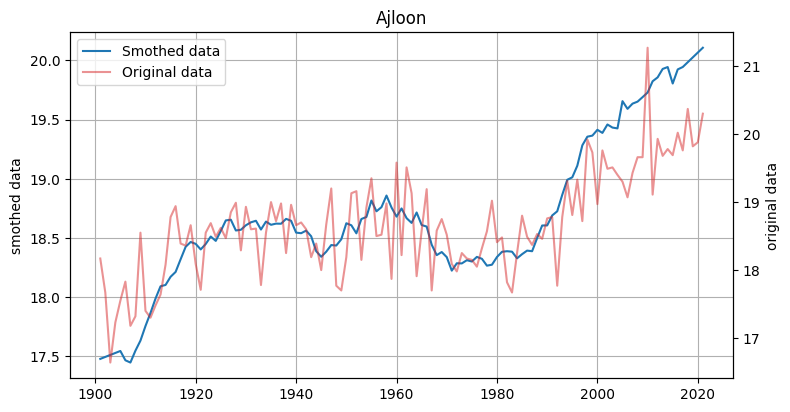

annual change percentage = 0.15063711070434951%


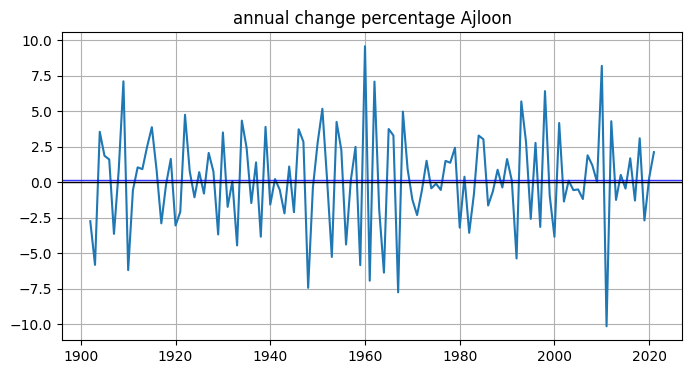

Balqa
     year      value
0    1901  17.455455
1    1902  17.473576
2    1903  17.491697
3    1904  17.509818
4    1905  17.527939
..    ...        ...
116  2017  19.916485
117  2018  19.955455
118  2019  19.994424
119  2020  20.033394
120  2021  20.072364

[121 rows x 2 columns]
dalta value= 2.616909090909086


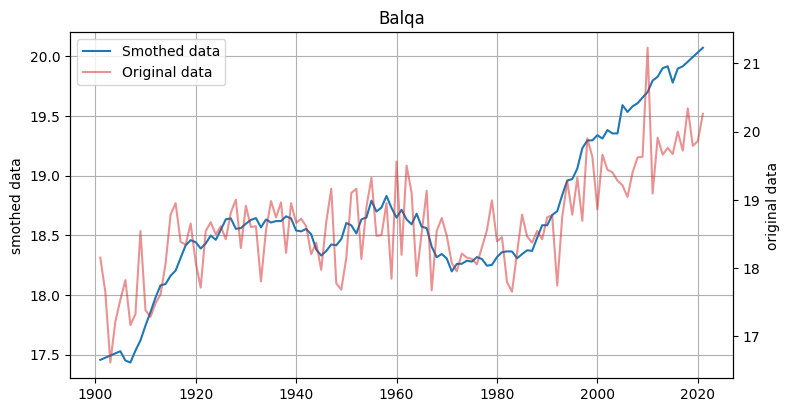

annual change percentage = 0.14997103996044425%


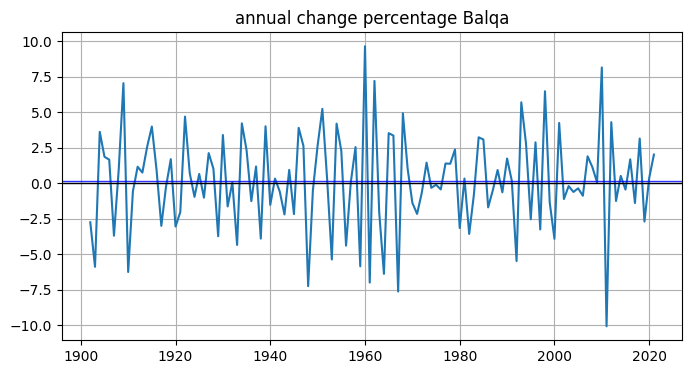

Aqaba
     year      value
0    1901  18.287273
1    1902  18.327879
2    1903  18.368485
3    1904  18.409091
4    1905  18.449697
..    ...        ...
116  2017  20.746606
117  2018  20.771818
118  2019  20.797030
119  2020  20.822242
120  2021  20.847455

[121 rows x 2 columns]
dalta value= 2.5601818181818246


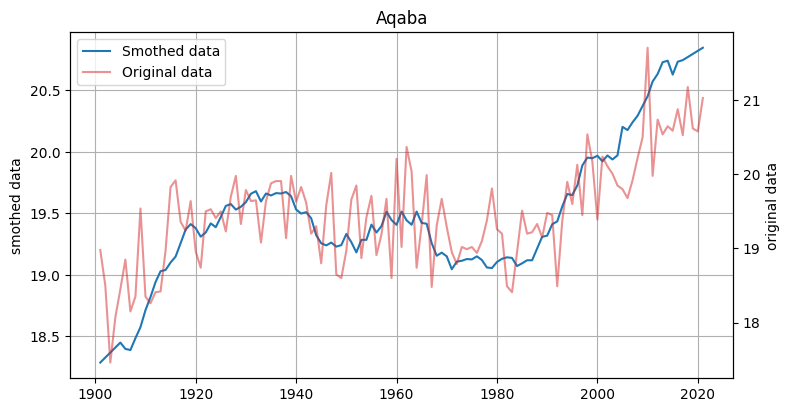

annual change percentage = 0.1340612846737362%


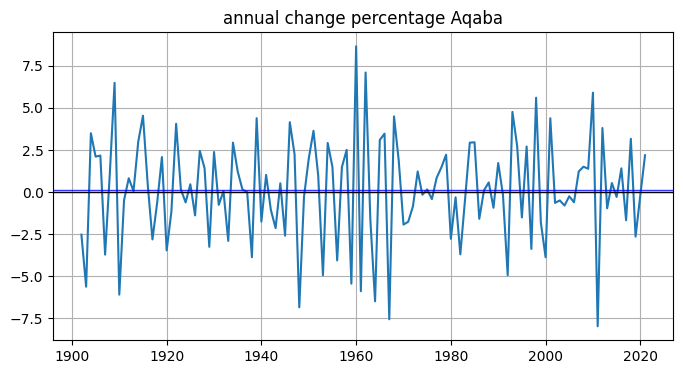

Karak
     year      value
0    1901  16.809636
1    1902  16.831939
2    1903  16.854242
3    1904  16.876545
4    1905  16.898848
..    ...        ...
116  2017  19.260909
117  2018  19.296727
118  2019  19.332545
119  2020  19.368364
120  2021  19.404182

[121 rows x 2 columns]
dalta value= 2.5945454545454503


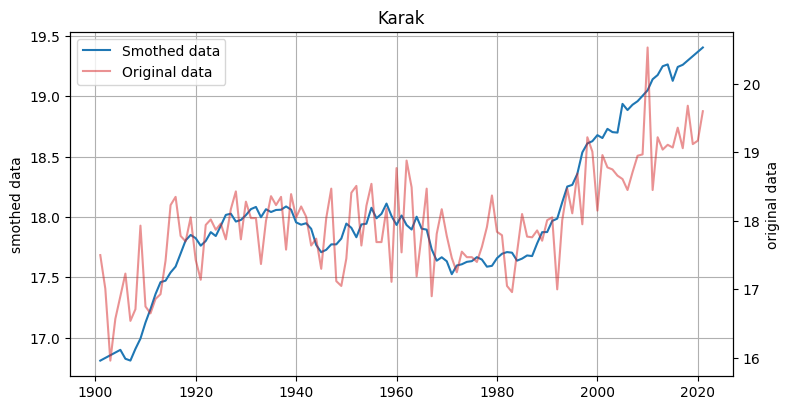

annual change percentage = 0.1563509197933797%


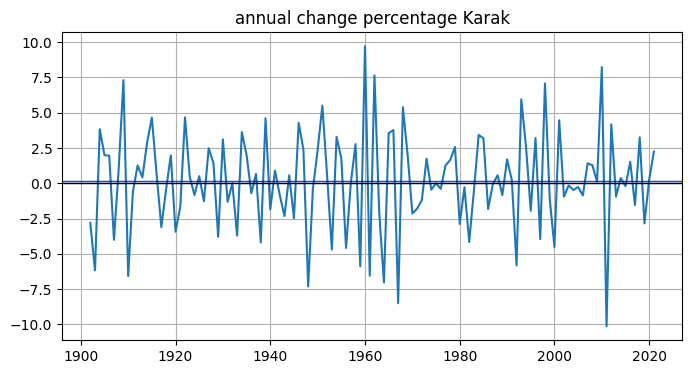

Amman
     year      value
0    1901  16.980727
1    1902  17.000788
2    1903  17.020848
3    1904  17.040909
4    1905  17.060970
..    ...        ...
116  2017  19.454364
117  2018  19.495091
118  2019  19.535818
119  2020  19.576545
120  2021  19.617273

[121 rows x 2 columns]
dalta value= 2.6365454545454554


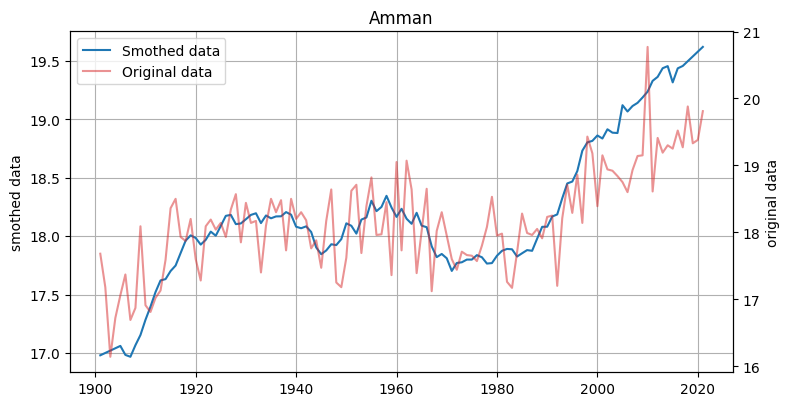

annual change percentage = 0.15688294887451826%


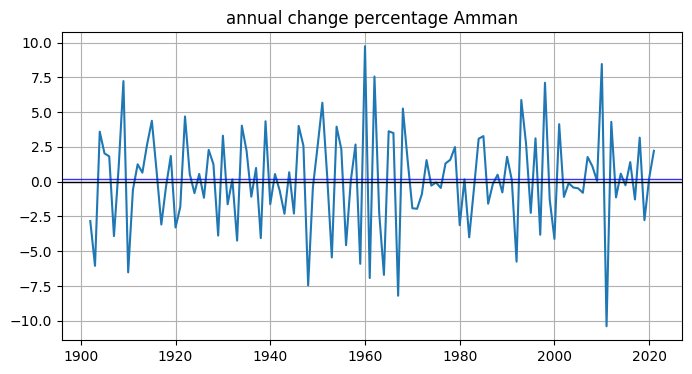

Tafiela
     year      value
0    1901  16.635818
1    1902  16.660970
2    1903  16.686121
3    1904  16.711273
4    1905  16.736424
..    ...        ...
116  2017  19.086121
117  2018  19.120364
118  2019  19.154606
119  2020  19.188848
120  2021  19.223091

[121 rows x 2 columns]
dalta value= 2.5872727272727225


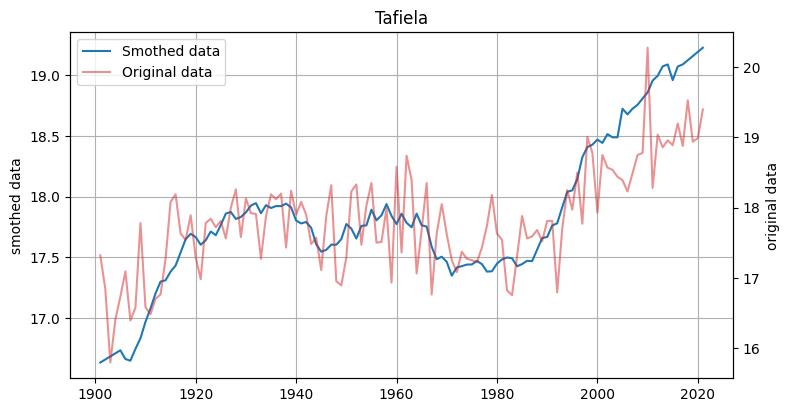

annual change percentage = 0.15680166535011847%


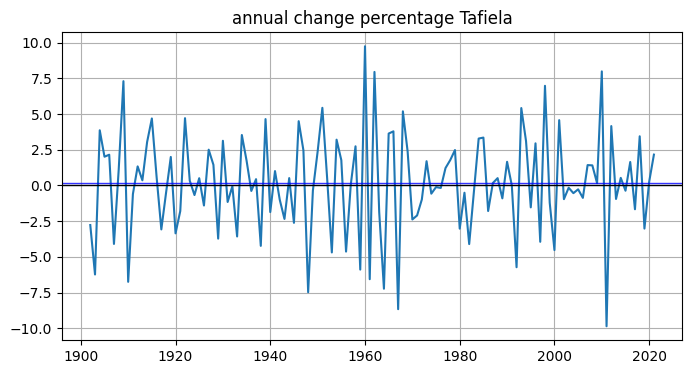

Irbid
     year      value
0    1901  17.858909
1    1902  17.870485
2    1903  17.882061
3    1904  17.893636
4    1905  17.905212
..    ...        ...
116  2017  20.328909
117  2018  20.372727
118  2019  20.416545
119  2020  20.460364
120  2021  20.504182

[121 rows x 2 columns]
dalta value= 2.645272727272733


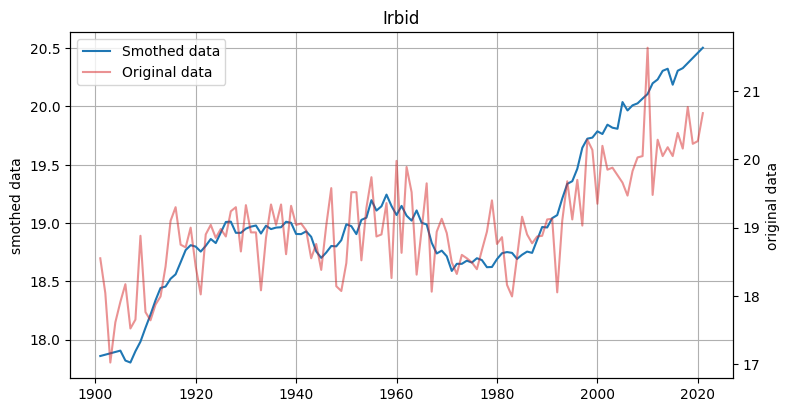

annual change percentage = 0.14812334256099782%


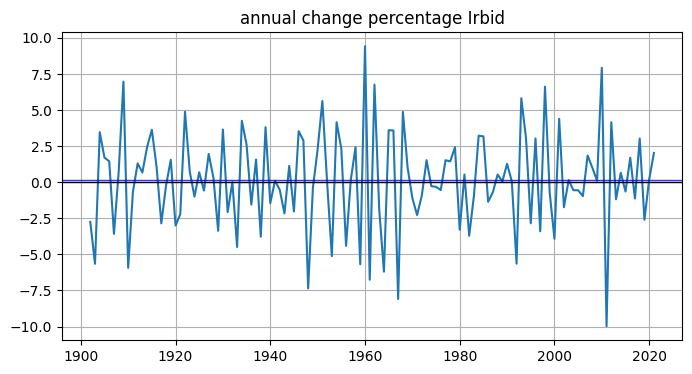

Jarash
     year      value
0    1901  17.478727
1    1902  17.495455
2    1903  17.512182
3    1904  17.528909
4    1905  17.545636
..    ...        ...
116  2017  19.943333
117  2018  19.984000
118  2019  20.024667
119  2020  20.065333
120  2021  20.106000

[121 rows x 2 columns]
dalta value= 2.627272727272725


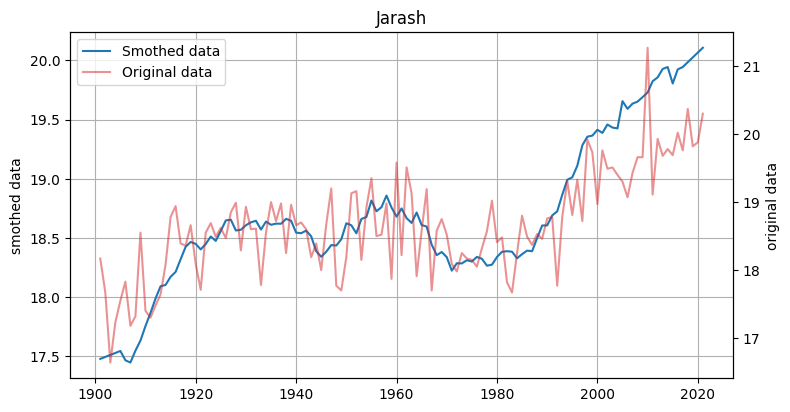

annual change percentage = 0.15063711070434951%


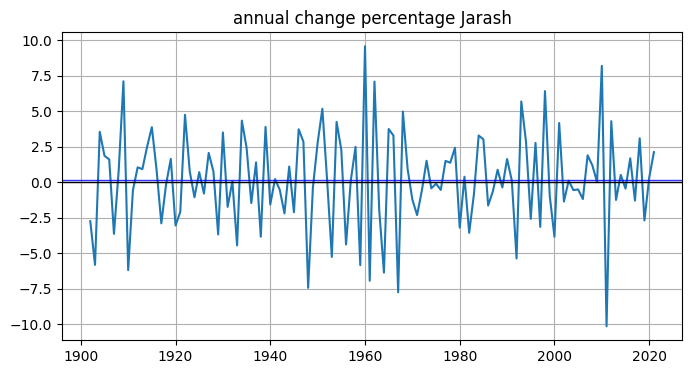

Ma'an
     year      value
0    1901  17.846182
1    1902  17.878364
2    1903  17.910545
3    1904  17.942727
4    1905  17.974909
..    ...        ...
116  2017  20.321576
117  2018  20.356727
118  2019  20.391879
119  2020  20.427030
120  2021  20.462182

[121 rows x 2 columns]
dalta value= 2.616000000000003


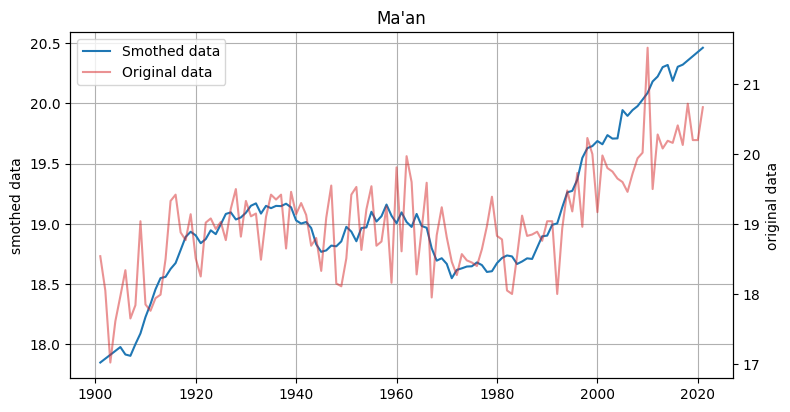

annual change percentage = 0.14554019853046607%


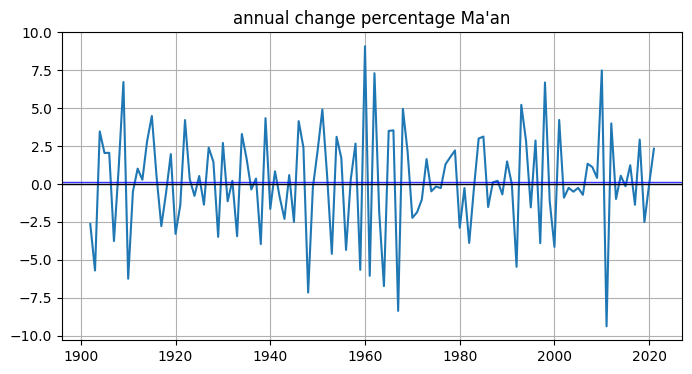

Madaba
     year      value
0    1901  17.354909
1    1902  17.375818
2    1903  17.396727
3    1904  17.417636
4    1905  17.438545
..    ...        ...
116  2017  19.809758
117  2018  19.847273
118  2019  19.884788
119  2020  19.922303
120  2021  19.959818

[121 rows x 2 columns]
dalta value= 2.604909090909093


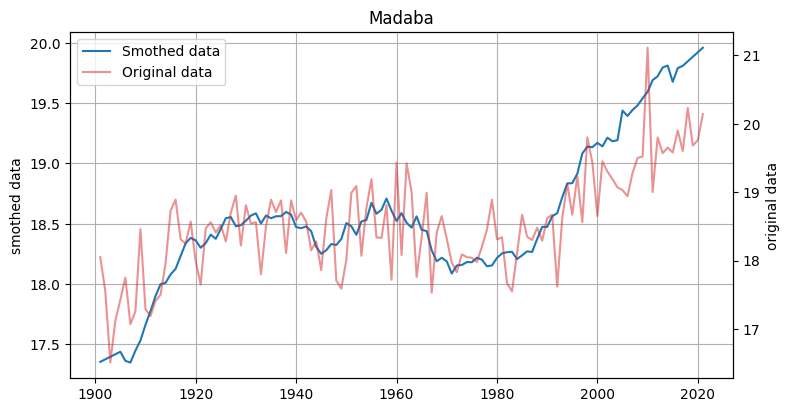

annual change percentage = 0.1499813890567018%


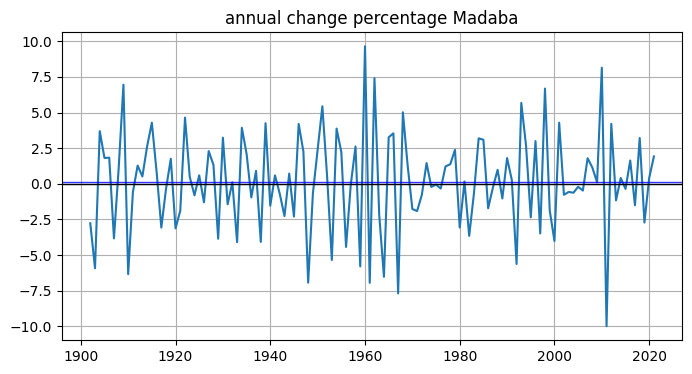

Mafraq
     year      value
0    1901  17.340909
1    1902  17.339818
2    1903  17.338727
3    1904  17.337636
4    1905  17.336545
..    ...        ...
116  2017  19.744909
117  2018  19.786727
118  2019  19.828545
119  2020  19.870364
120  2021  19.912182

[121 rows x 2 columns]
dalta value= 2.5712727272727207


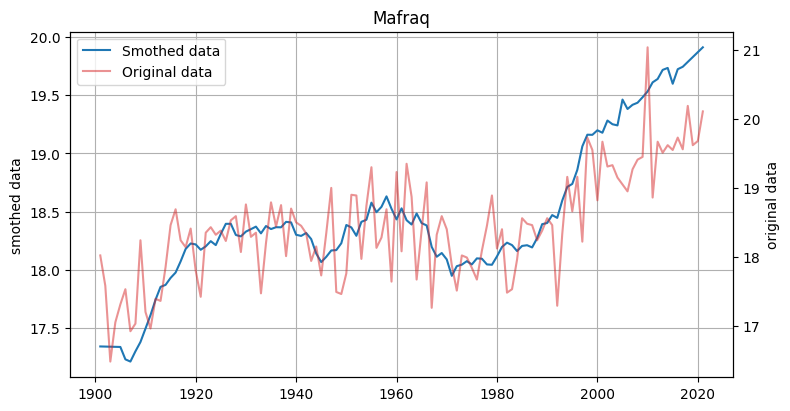

annual change percentage = 0.15722850998184423%


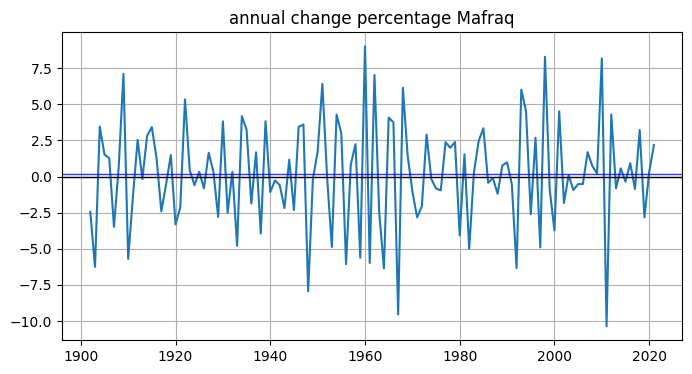

Zarqa
     year      value
0    1901  17.761273
1    1902  17.775212
2    1903  17.789152
3    1904  17.803091
4    1905  17.817030
..    ...        ...
116  2017  20.237091
117  2018  20.279273
118  2019  20.321455
119  2020  20.363636
120  2021  20.405818

[121 rows x 2 columns]
dalta value= 2.6445454545454616


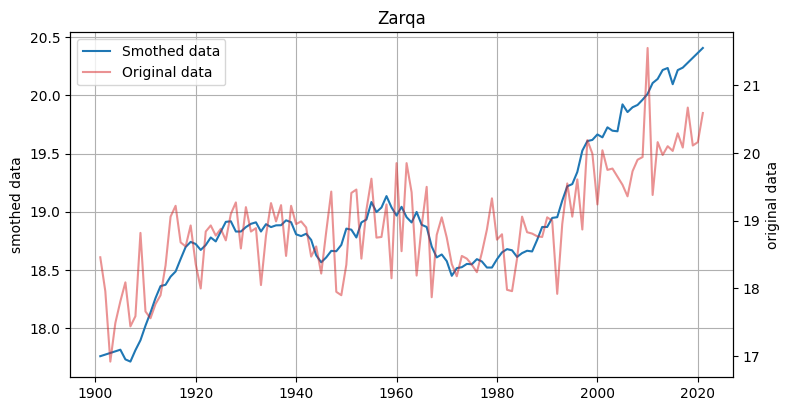

annual change percentage = 0.14964693801184667%


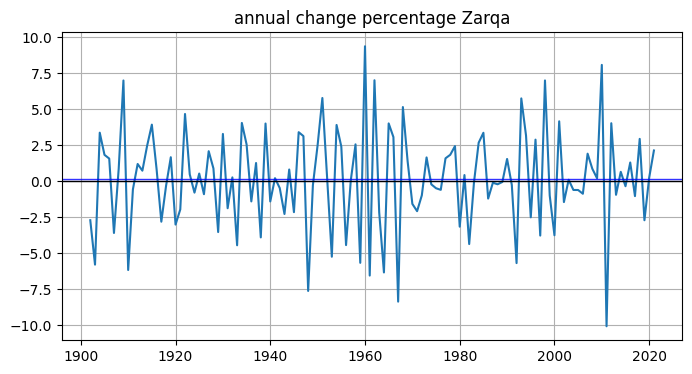

In [160]:
governates=jor_temp_df.columns[1:]
for wanted_governates in governates:
    data_smother_visualizer(jor_temp_df,wanted_governates)

    

## co2 annual change percentage

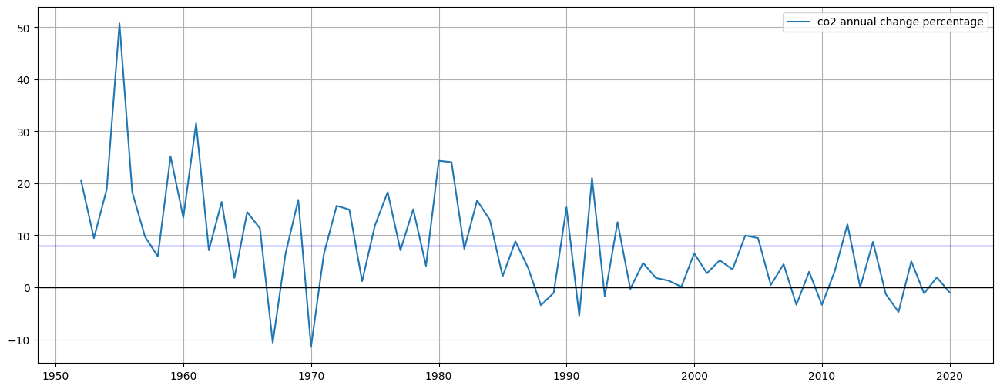

In [161]:
fig, ax = plt.subplots()
fig.set_figwidth(16)
fig.set_figheight(6)

ax.plot(co2_df['Year'],co2_df['co2_prc']*100,label='co2 annual change percentage')

ax.axhline(y=0, lw=1, color='k',alpha=1)
ax.axhline(y=co2_df['co2_prc'].mean()*100, lw=1, color='blue',alpha=.8)
plt.legend()


plt.grid()
plt.show()

## CO2 Cumulative Emissions and temperature for each month

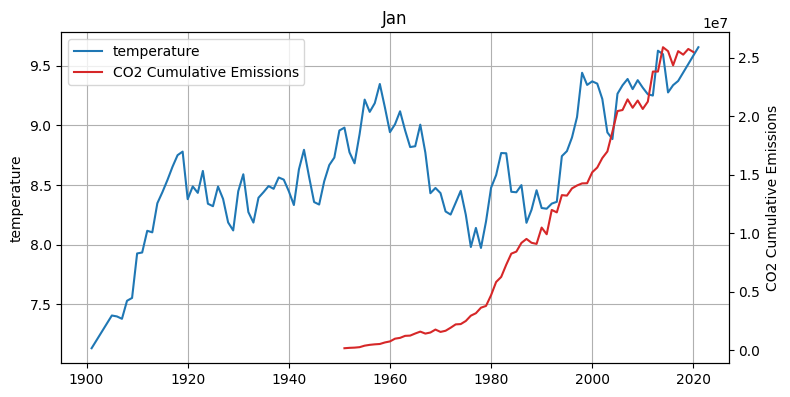

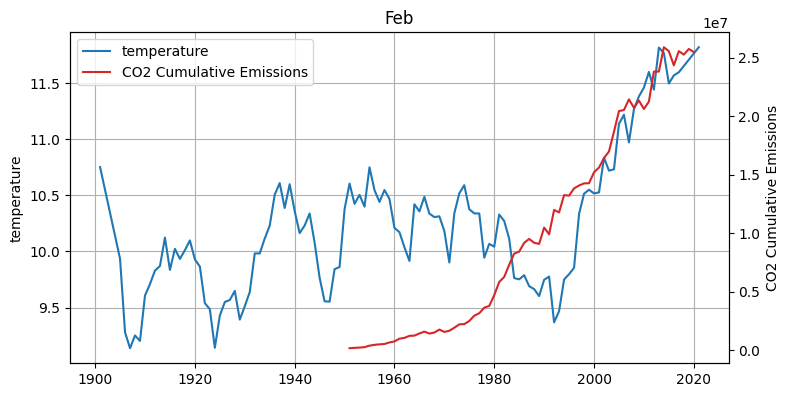

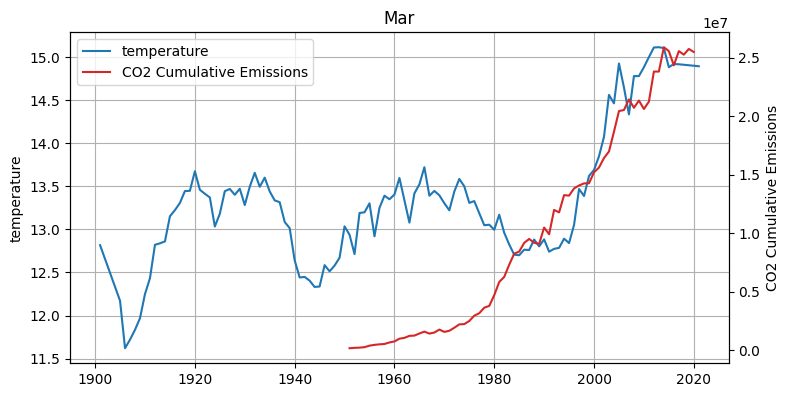

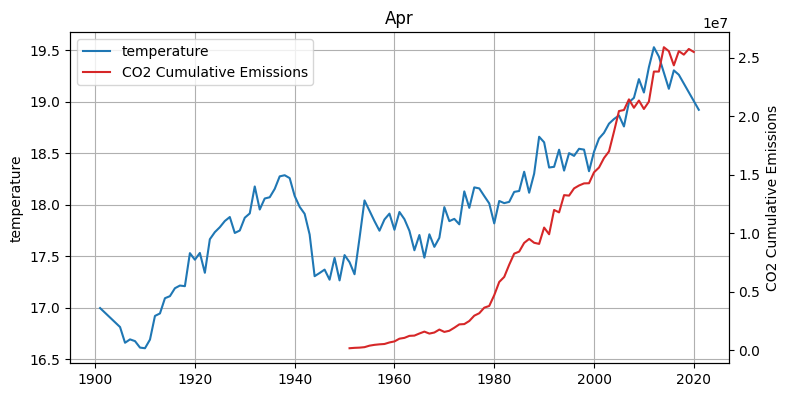

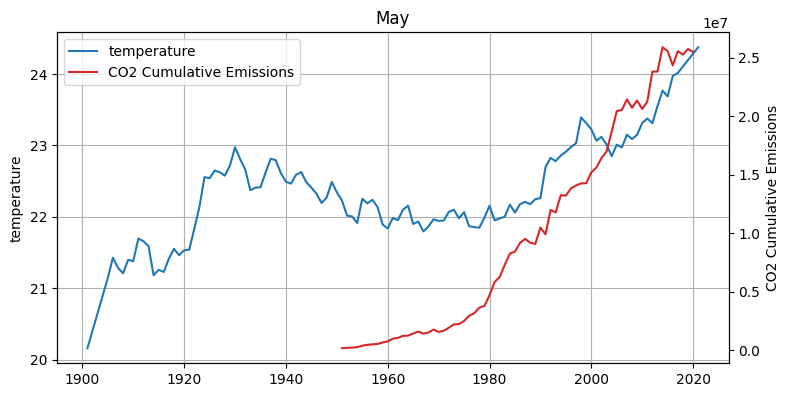

...

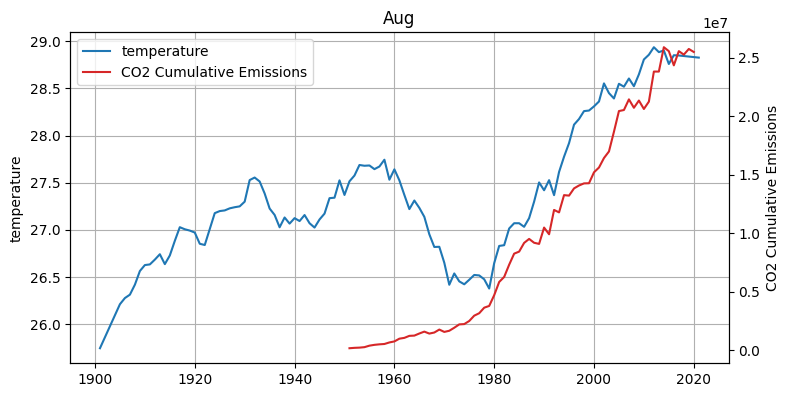

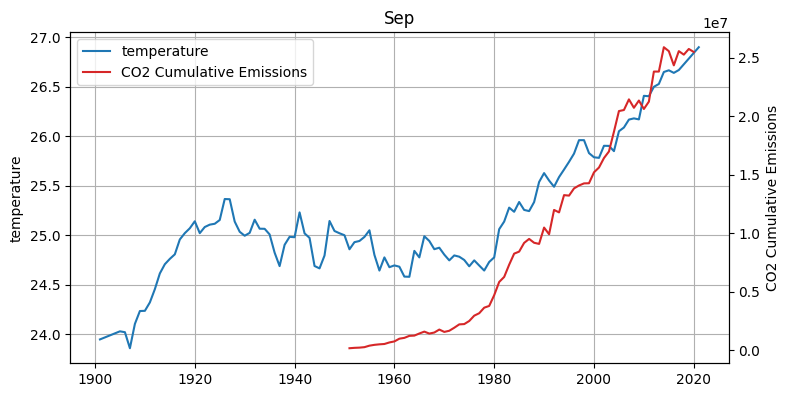

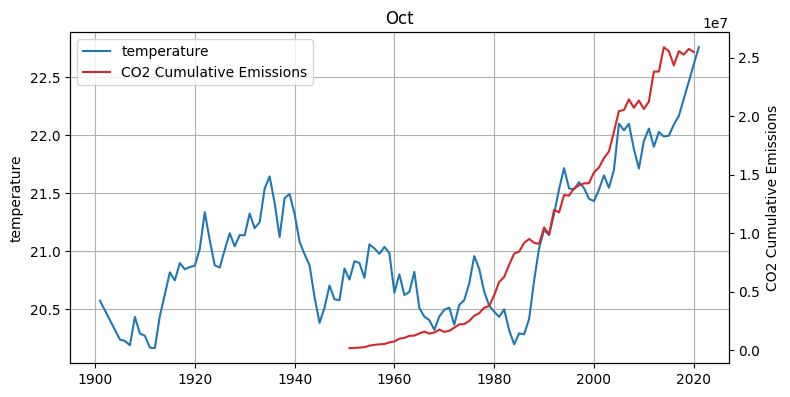

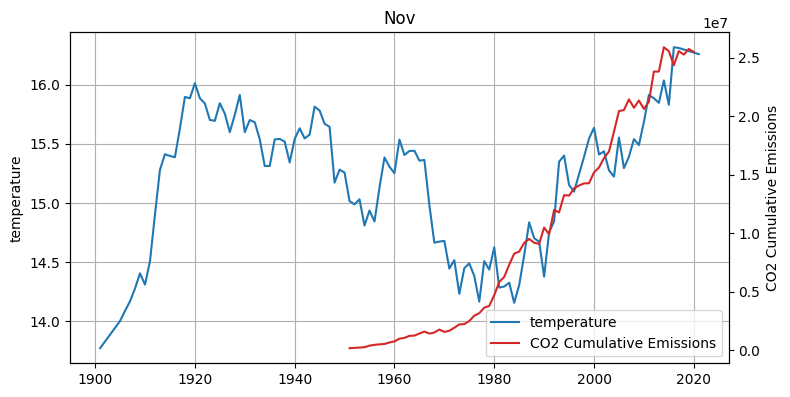

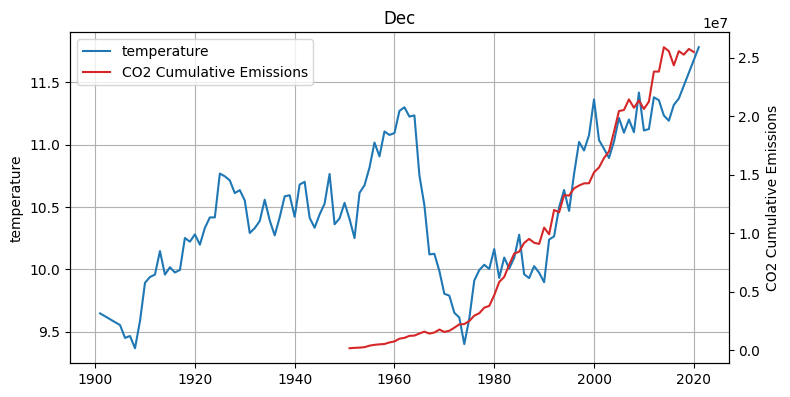

In [162]:
for wanted_month in monthss:    
    fig, ax1 = plt.subplots()
    fig.set_figwidth(8)
    fig.set_figheight(4)

    plot1=ax1.plot(df['Year'],df[wanted_month], color='tab:blue',label='temperature')
    ax1.set_ylabel('temperature')  
    plt.grid()

    ax2 = ax1.twinx()
    ax2.set_ylabel('CO2 Cumulative Emissions')  
    plot2=ax2.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:red',label='CO2 Cumulative Emissions')

    fig.tight_layout()
    plt.title(wanted_month)
    lns = plot1+plot2
    labs = [l.get_label() for l in lns]
    
    ax1.legend(lns, labs, loc=0)

    plt.show()

## CO2 Cumulative Emissions and temperature for each governate

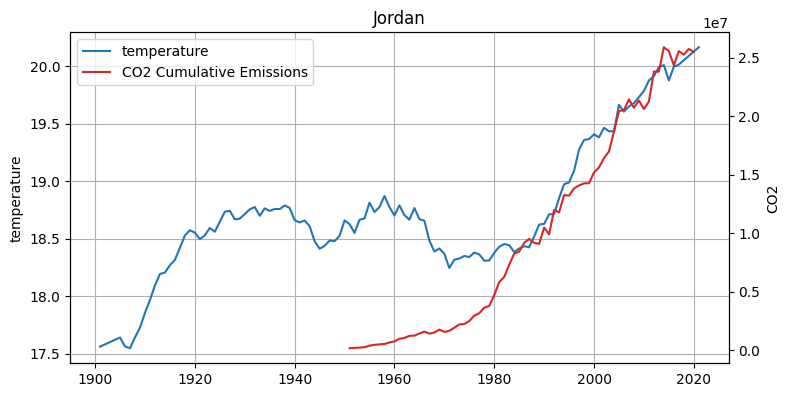

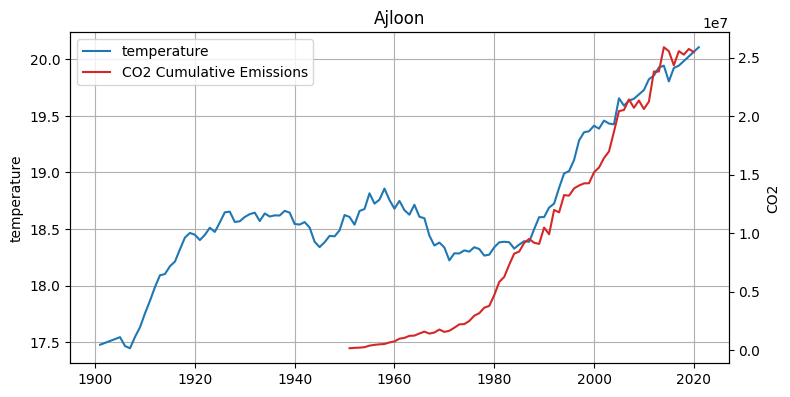

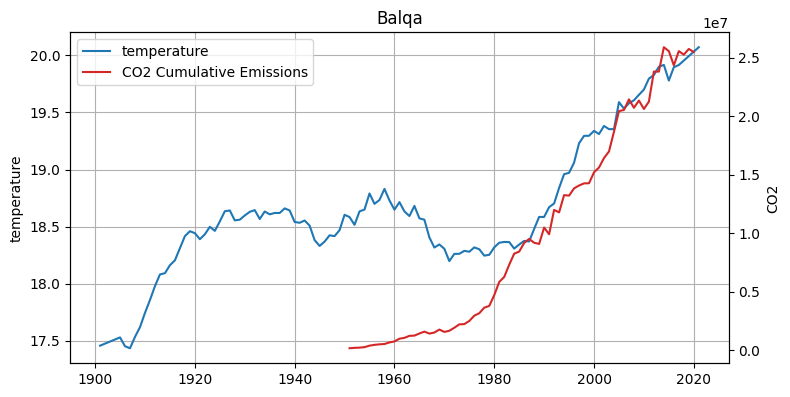

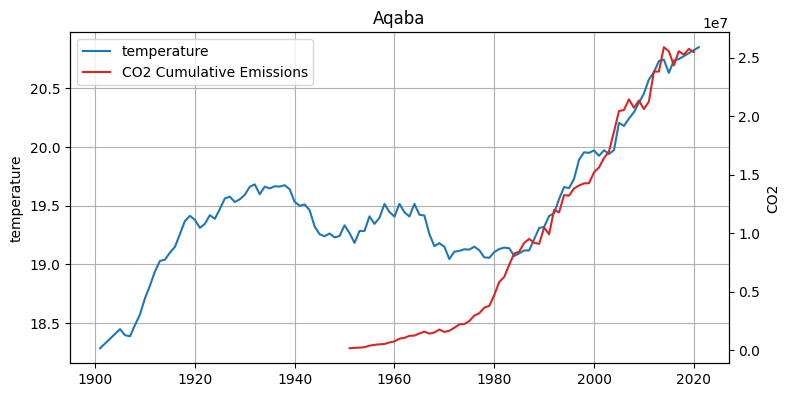

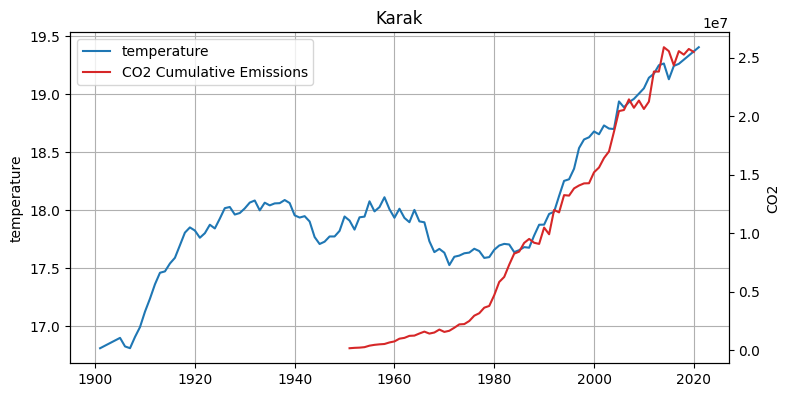

...

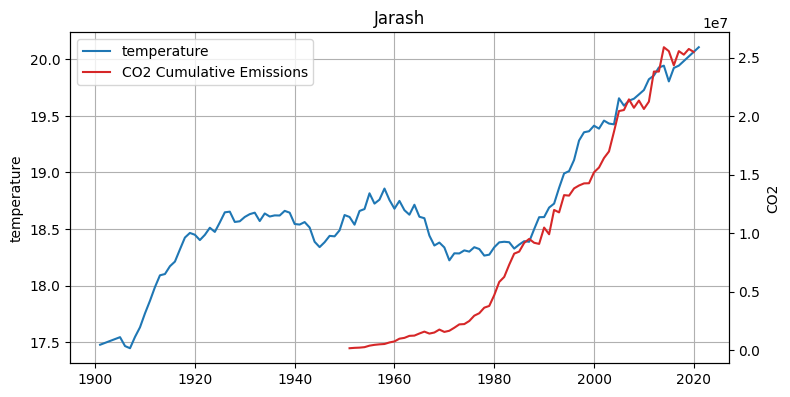

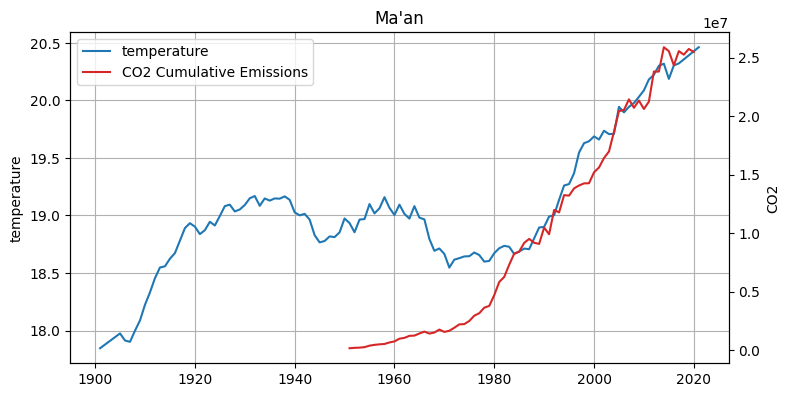

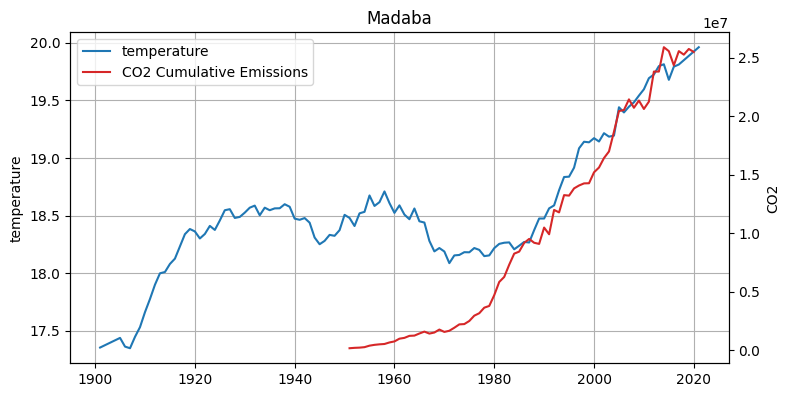

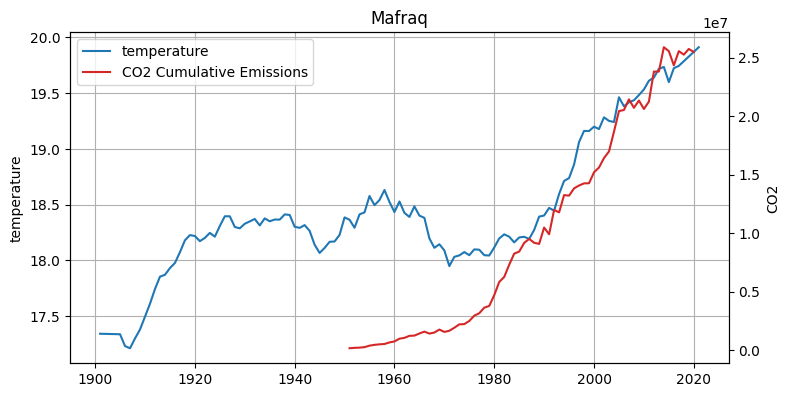

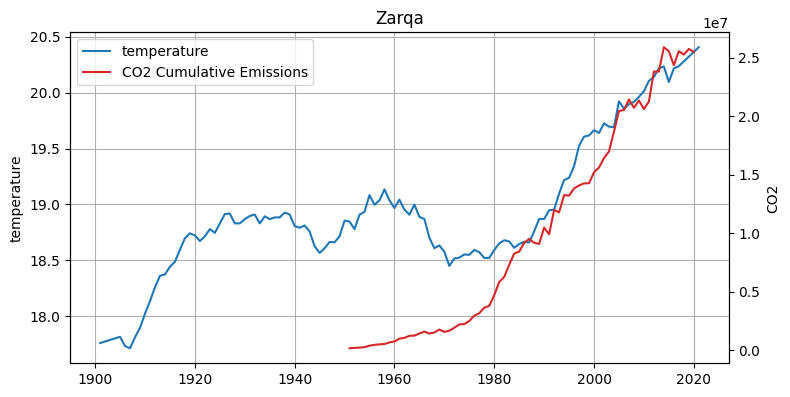

In [163]:
for wanted_governates in governates:    
    fig, ax1 = plt.subplots()
    fig.set_figwidth(8)
    fig.set_figheight(4)

    plot1=ax1.plot(jor_temp_df['Year'],jor_temp_df[wanted_governates], color='tab:blue',label='temperature')
    ax1.set_ylabel('temperature')  
    plt.grid()

    ax2 = ax1.twinx()
    ax2.set_ylabel('CO2')  
    plot2=ax2.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:red',label='CO2 Cumulative Emissions')

    fig.tight_layout()
    plt.title(wanted_governates)
    lns = plot1+plot2
    labs = [l.get_label() for l in lns]
    ax1.legend(lns, labs, loc=0)
    
    plt.show()

## CO2 Cumulative Emissions, temperature and Agricultural land 

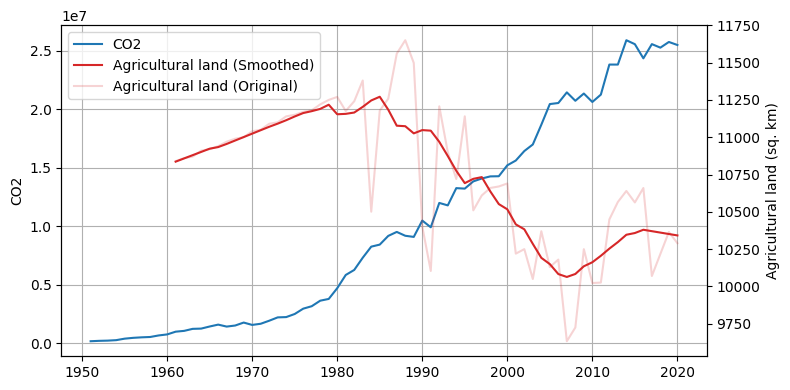

In [164]:
# jor_temp_df['Year']=pd.to_datetime(jor_temp_df['Year'])
new_values=savgol_filter(jor_temp_df['Jordan'],10,1)
fig, ax1 = plt.subplots()
fig.set_figwidth(8)
fig.set_figheight(4)
plot1=ax1.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:blue',label='CO2')
ax1.set_ylabel('CO2')  
plt.grid()
ax2 = ax1.twinx()
ax2.set_ylabel('Agricultural land (sq. km)')  
plot2=ax2.plot(land_df['Year'],savgol_filter(land_df['Value'],10,1), color='tab:red',label="Agricultural land (Smoothed)")
plot3=ax2.plot(land_df['Year'],land_df['Value'], color='tab:red',alpha=0.2,label="Agricultural land (Original)")

lns = plot1+plot2+plot3
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc=0)

fig.tight_layout()

plt.show()

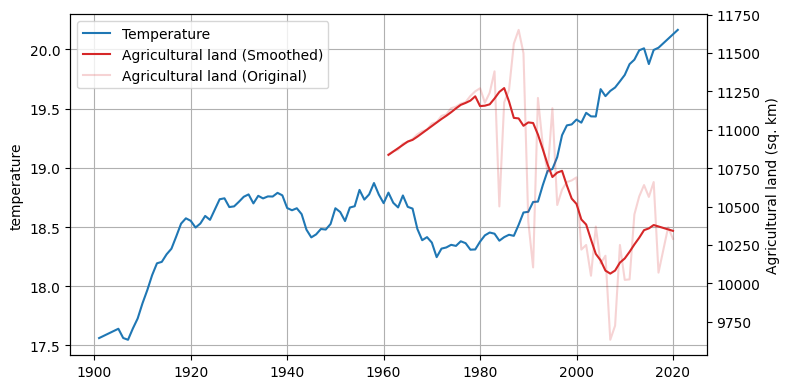

In [165]:
# jor_temp_df['Year']=pd.to_datetime(jor_temp_df['Year'])
new_values=savgol_filter(jor_temp_df['Jordan'],10,1)
fig, ax1 = plt.subplots()
fig.set_figwidth(8)
fig.set_figheight(4)
plot1=ax1.plot(jor_temp_df['Year'],jor_temp_df['Jordan'], color='tab:blue',label='Temperature')
ax1.set_ylabel('temperature')  
plt.grid()
ax2 = ax1.twinx()
ax2.set_ylabel('Agricultural land (sq. km)')  
plot2=ax2.plot(land_df['Year'],savgol_filter(land_df['Value'],10,1), color='tab:red',label="Agricultural land (Smoothed)")
plot3=ax2.plot(land_df['Year'],land_df['Value'], color='tab:red',alpha=0.2,label="Agricultural land (Original)")

lns = plot1+plot2+plot3
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc=0)

fig.tight_layout()

plt.show()

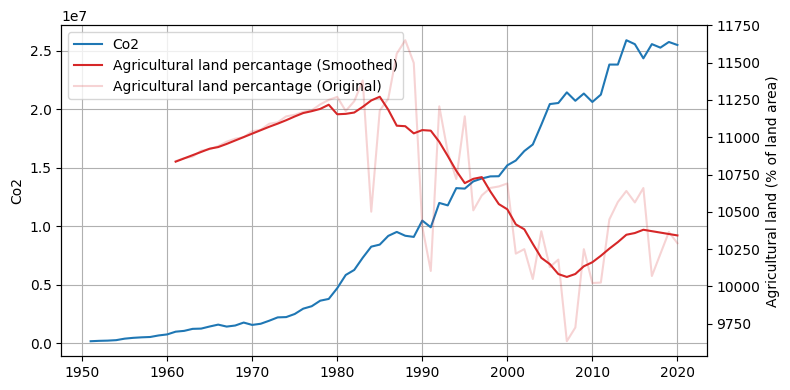

In [166]:
# jor_temp_df['Year']=pd.to_datetime(jor_temp_df['Year'])
new_values=savgol_filter(jor_temp_df['Jordan'],10,1)
fig, ax1 = plt.subplots()
fig.set_figwidth(8)
fig.set_figheight(4)
plot1=ax1.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:blue',label='Co2')
ax1.set_ylabel('Co2')  
plt.grid()
ax2 = ax1.twinx()
ax2.set_ylabel('Agricultural land (% of land area)')  
plot2=ax2.plot(land_df['Year'],savgol_filter(land_df['Value'],10,1), color='tab:red',label="Agricultural land percantage (Smoothed)")
plot3=ax2.plot(land_df['Year'],land_df['Value'], color='tab:red',alpha=0.2,label="Agricultural land percantage (Original)")

lns = plot1+plot2+plot3
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc=0)

fig.tight_layout()

plt.show()

## visualizing the rain value for each month before and after smoothing

Jan
     year      value
0    1901  33.255636
1    1902  32.787939
2    1903  32.320242
3    1904  31.852545
4    1905  31.384848
..    ...        ...
116  2017  22.876121
117  2018  22.400364
118  2019  21.924606
119  2020  21.448848
120  2021  20.973091

[121 rows x 2 columns]
dalta value= -12.282545454545456


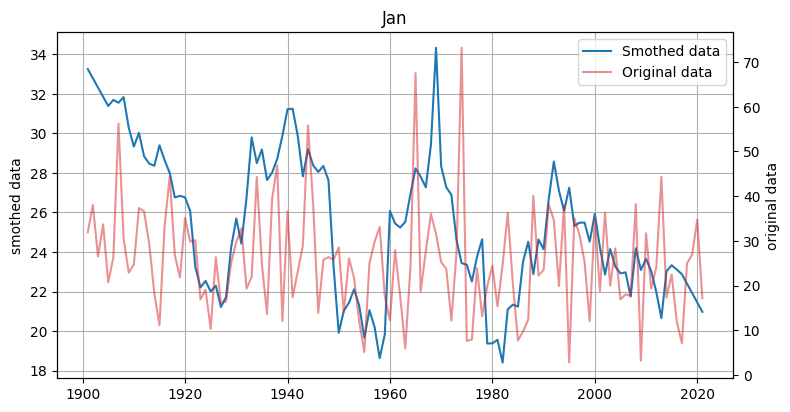

annual change percentage = 37.39775463421993%


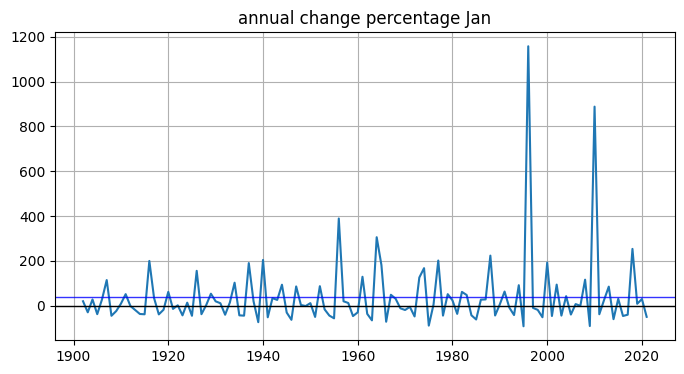

Feb
     year      value
0    1901  14.543818
1    1902  15.345636
2    1903  16.147455
3    1904  16.949273
4    1905  17.751091
..    ...        ...
116  2017  21.679758
117  2018  23.121273
118  2019  24.562788
119  2020  26.004303
120  2021  27.445818

[121 rows x 2 columns]
dalta value= 12.902000000000003


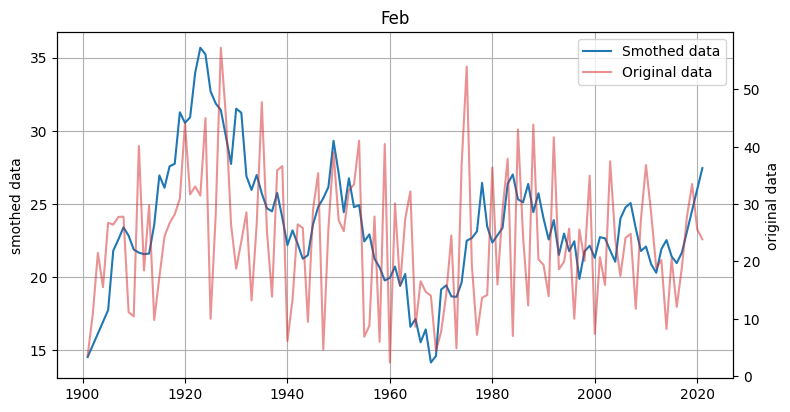

annual change percentage = 48.31275016422206%


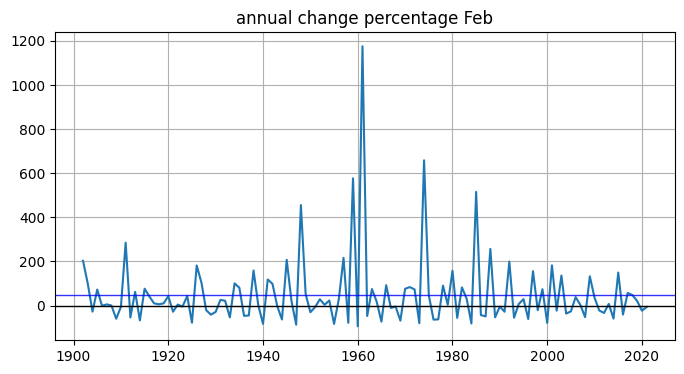

Mar
     year      value
0    1901  14.924909
1    1902  16.206485
2    1903  17.488061
3    1904  18.769636
4    1905  20.051212
..    ...        ...
116  2017  13.813576
117  2018  13.434727
118  2019  13.055879
119  2020  12.677030
120  2021  12.298182

[121 rows x 2 columns]
dalta value= -2.626727272727271


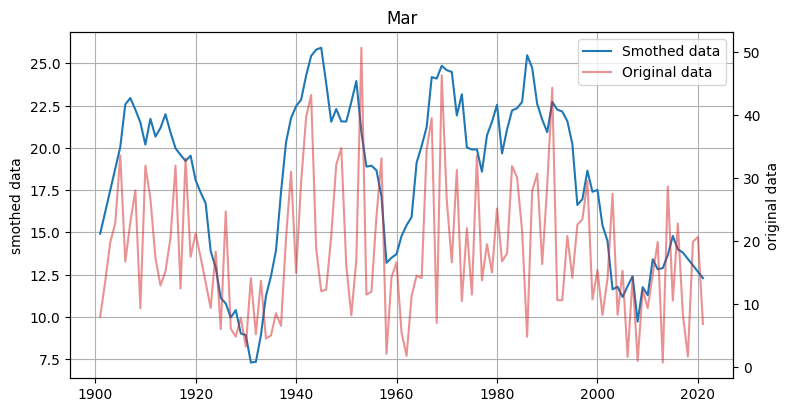

annual change percentage = 91.1254953031579%


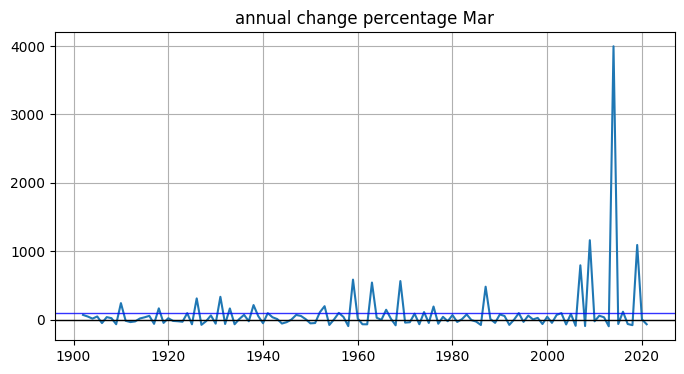

Apr
     year      value
0    1901   6.896727
1    1902   8.484788
2    1903  10.072848
3    1904  11.660909
4    1905  13.248970
..    ...        ...
116  2017   7.201515
117  2018   7.734545
118  2019   8.267576
119  2020   8.800606
120  2021   9.333636

[121 rows x 2 columns]
dalta value= 2.436909090909089


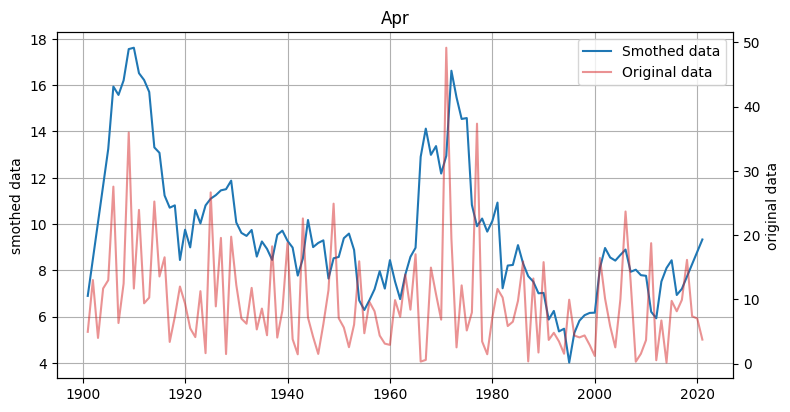

annual change percentage = 207.49839859972155%


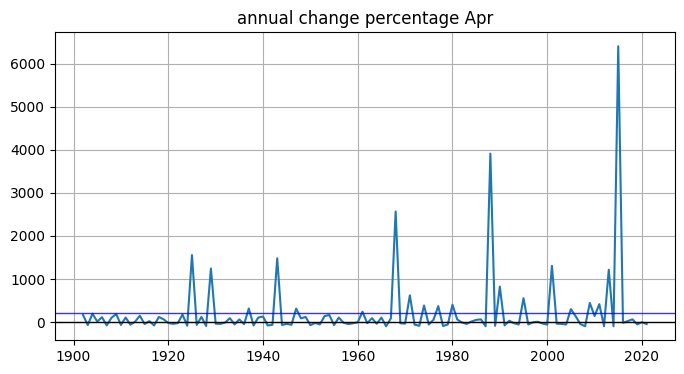

May
     year     value
0    1901  6.777273
1    1902  6.621212
2    1903  6.465152
3    1904  6.309091
4    1905  6.153030
..    ...       ...
116  2017  4.141394
117  2018  3.938182
118  2019  3.734970
119  2020  3.531758
120  2021  3.328545

[121 rows x 2 columns]
dalta value= -3.448727272727271


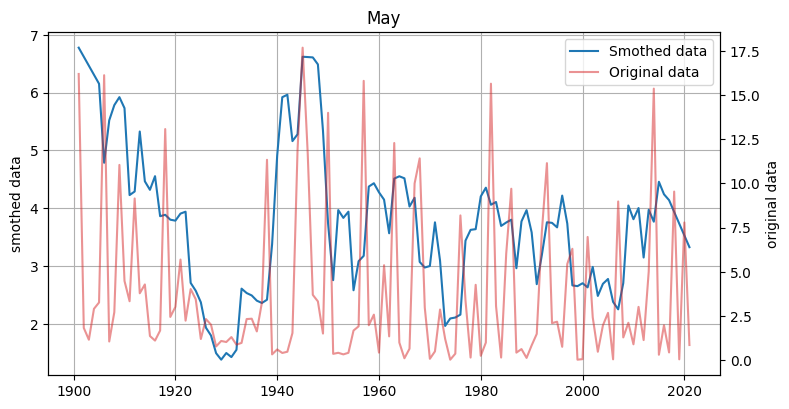

annual change percentage = 679.4870842493974%


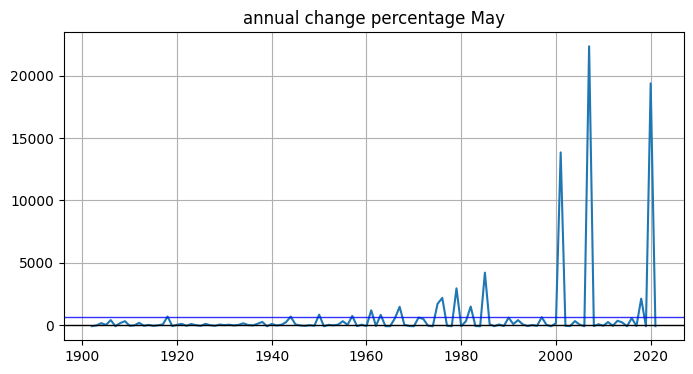

Jun
     year     value
0    1901  0.095455
1    1902  0.104909
2    1903  0.114364
3    1904  0.123818
4    1905  0.133273
..    ...       ...
116  2017  0.034970
117  2018  0.038909
118  2019  0.042848
119  2020  0.046788
120  2021  0.050727

[121 rows x 2 columns]
dalta value= -0.04472727272727267


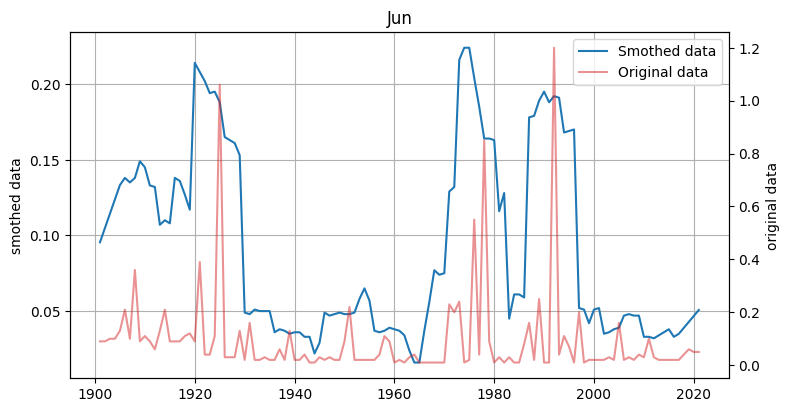

annual change percentage = 228.14021060969014%


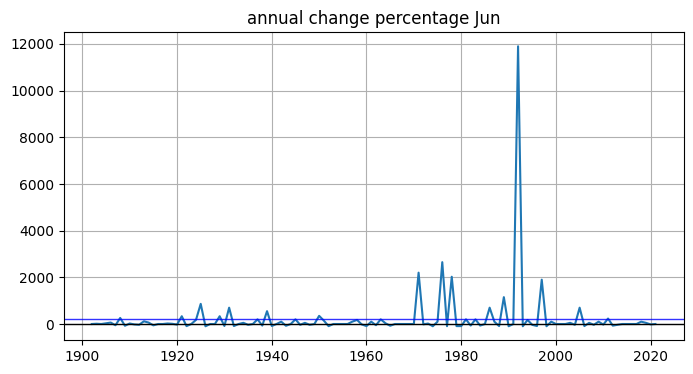

Jul
     year  value
0    1901   0.07
1    1902   0.07
2    1903   0.07
3    1904   0.07
4    1905   0.07
..    ...    ...
116  2017   0.07
117  2018   0.07
118  2019   0.07
119  2020   0.07
120  2021   0.07

[121 rows x 2 columns]
dalta value= 0.0


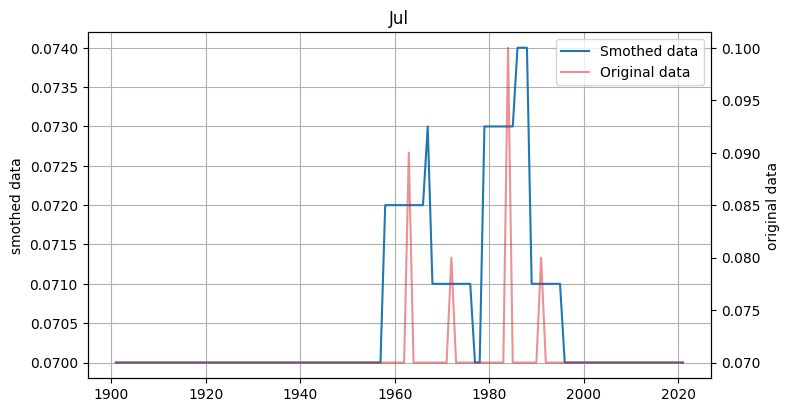

annual change percentage = 0.18981481481481496%


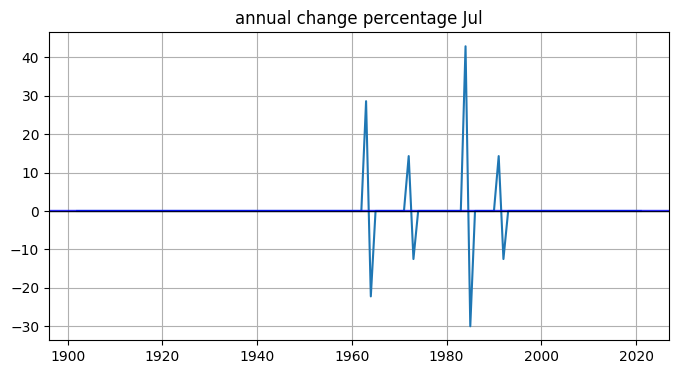

Aug
     year     value
0    1901  0.070000
1    1902  0.070000
2    1903  0.070000
3    1904  0.070000
4    1905  0.070000
..    ...       ...
116  2017  0.016364
117  2018  0.013091
118  2019  0.009818
119  2020  0.006545
120  2021  0.003273

[121 rows x 2 columns]
dalta value= -0.06672727272727272


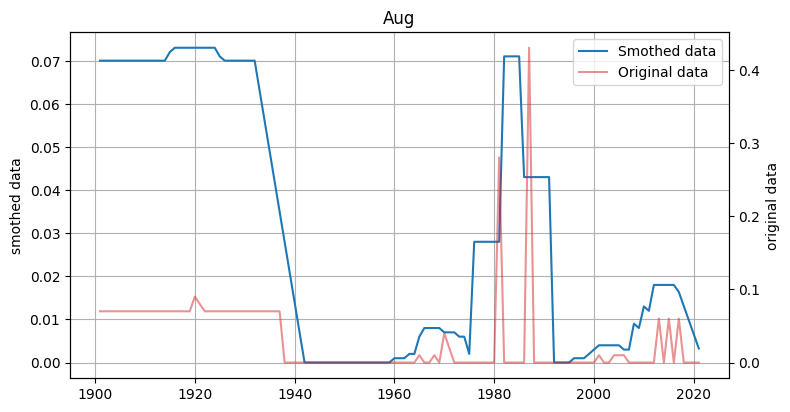

annual change percentage = inf%


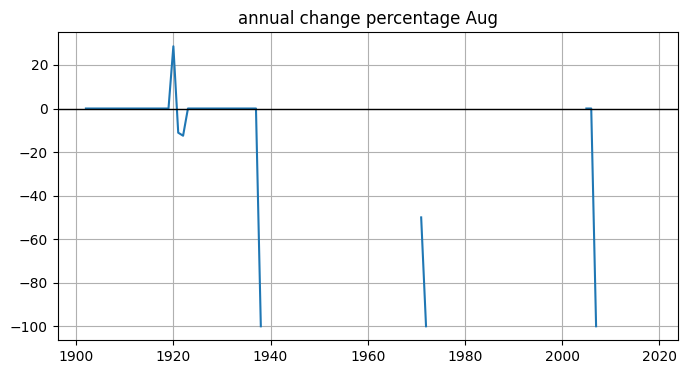

Sep
     year     value
0    1901  0.010727
1    1902  0.022788
2    1903  0.034848
3    1904  0.046909
4    1905  0.058970
..    ...       ...
116  2017  0.049697
117  2018  0.035091
118  2019  0.020485
119  2020  0.005879
120  2021 -0.008727

[121 rows x 2 columns]
dalta value= -0.01945454545454548


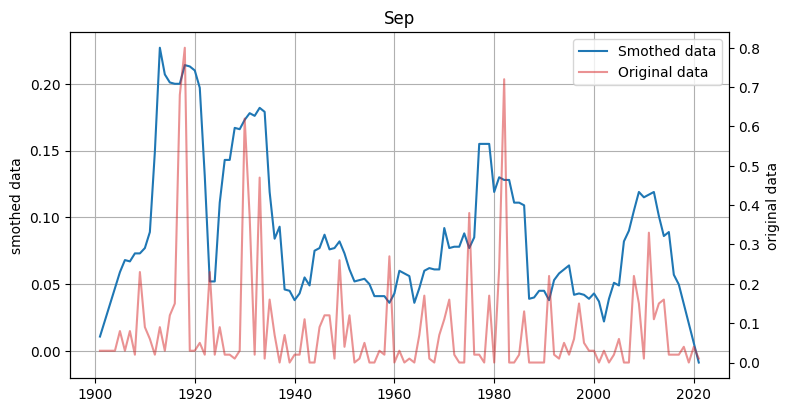

annual change percentage = inf%


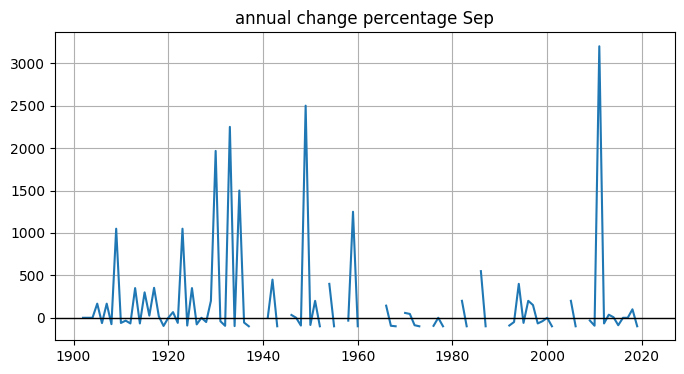

Oct
     year     value
0    1901  3.192000
1    1902  3.456667
2    1903  3.721333
3    1904  3.986000
4    1905  4.250667
..    ...       ...
116  2017  5.254364
117  2018  4.831091
118  2019  4.407818
119  2020  3.984545
120  2021  3.561273

[121 rows x 2 columns]
dalta value= 0.3692727272727283


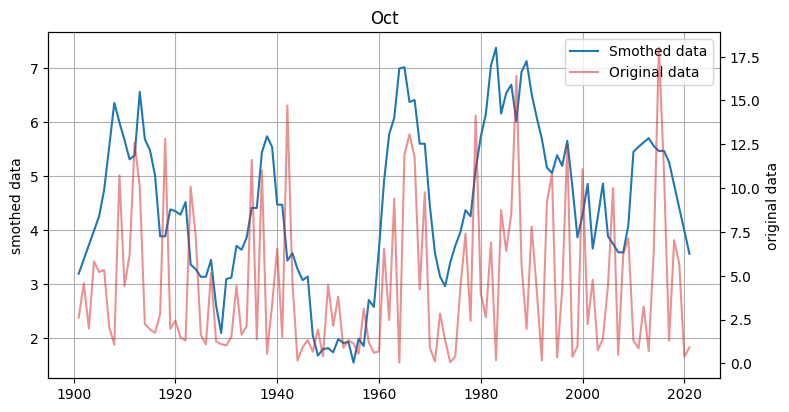

annual change percentage = 422.8852058724354%


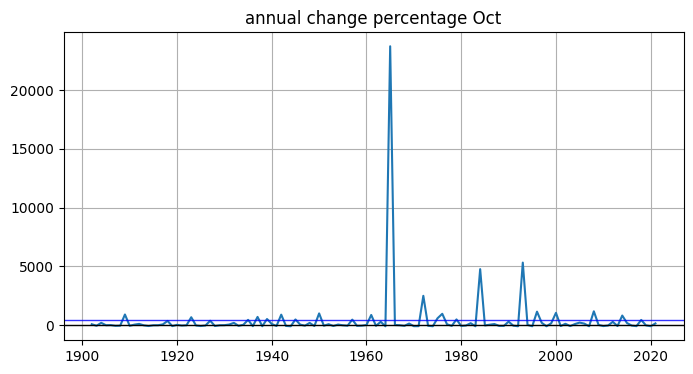

Nov
     year      value
0    1901  15.919091
1    1902  15.275515
2    1903  14.631939
3    1904  13.988364
4    1905  13.344788
..    ...        ...
116  2017  12.511455
117  2018  12.072364
118  2019  11.633273
119  2020  11.194182
120  2021  10.755091

[121 rows x 2 columns]
dalta value= -5.164


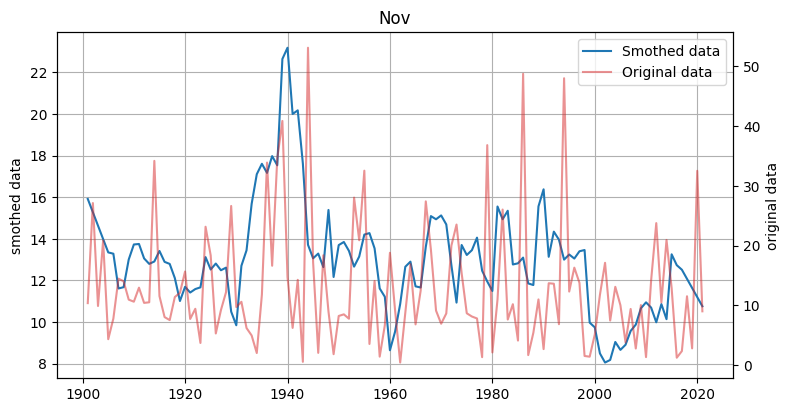

annual change percentage = 198.0039584285516%


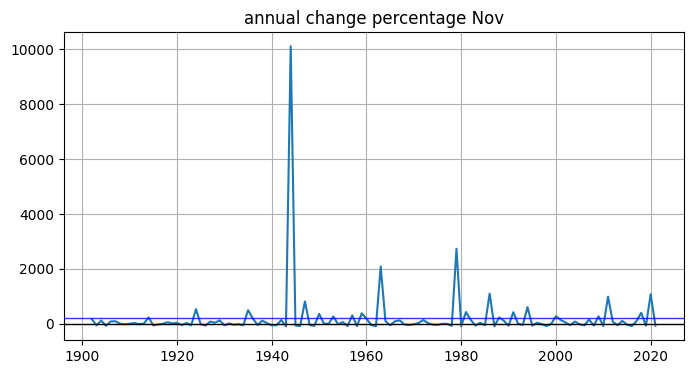

Dec
     year      value
0    1901  30.282000
1    1902  28.495333
2    1903  26.708667
3    1904  24.922000
4    1905  23.135333
..    ...        ...
116  2017  19.626970
117  2018  19.852909
118  2019  20.078848
119  2020  20.304788
120  2021  20.530727

[121 rows x 2 columns]
dalta value= -9.751272727272703


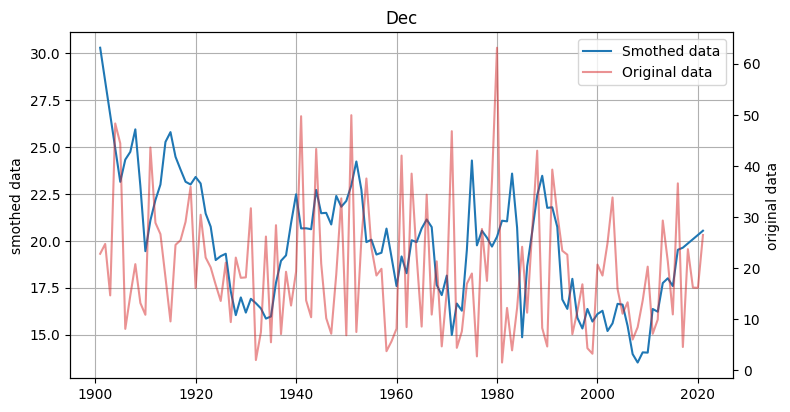

annual change percentage = 66.31136314207379%


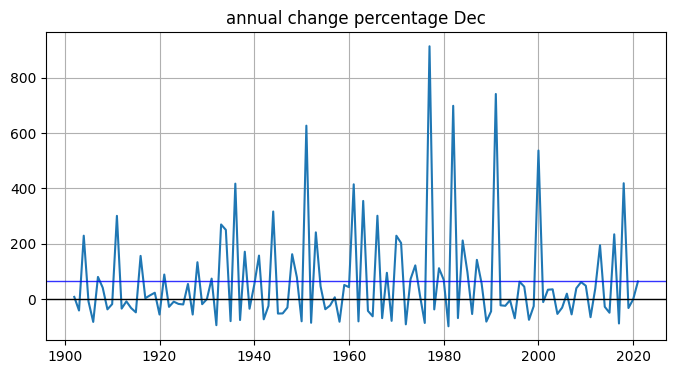

In [167]:
monthss=rain_df.columns[1:]
for wanted_month in monthss:    
    data_smother_visualizer(rain_df,wanted_month)

    

## CO2 Cumulative Emissions and rain value for each month

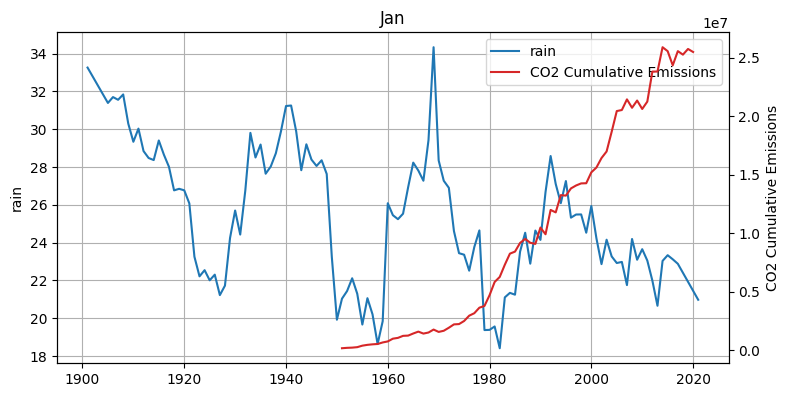

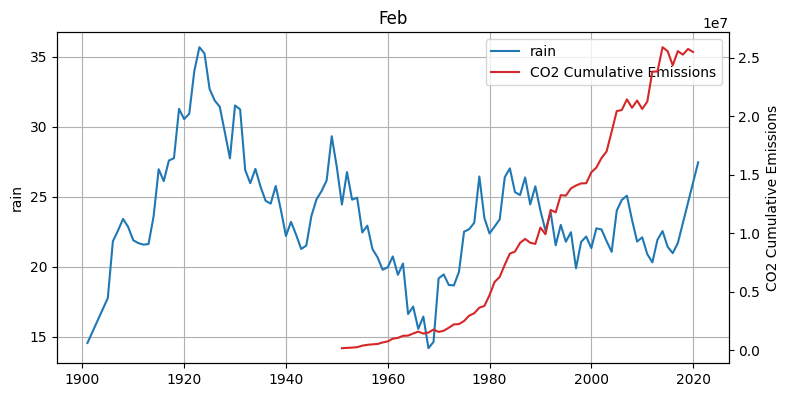

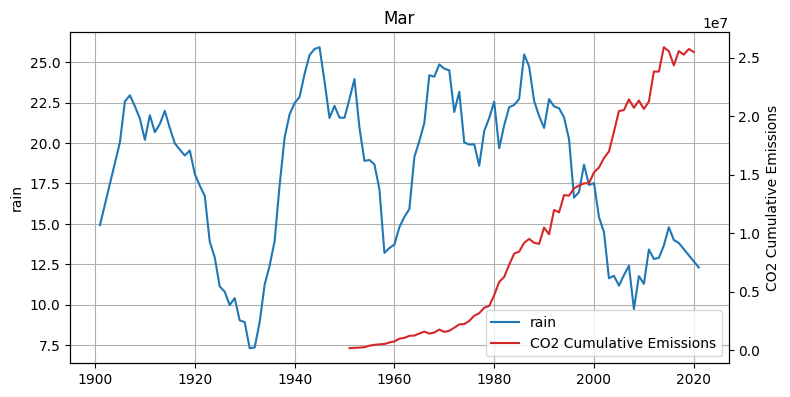

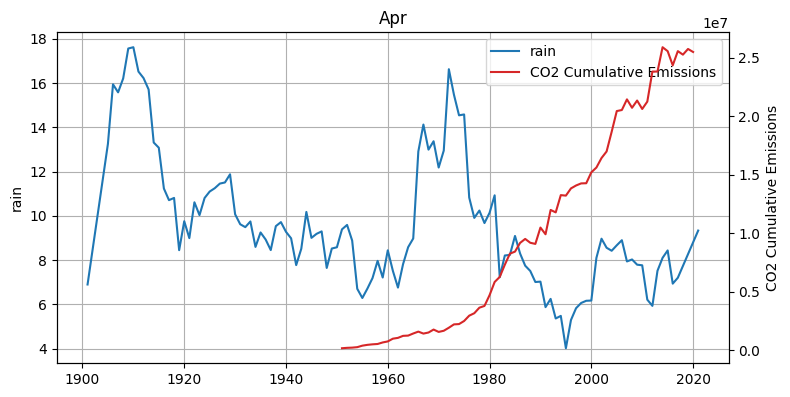

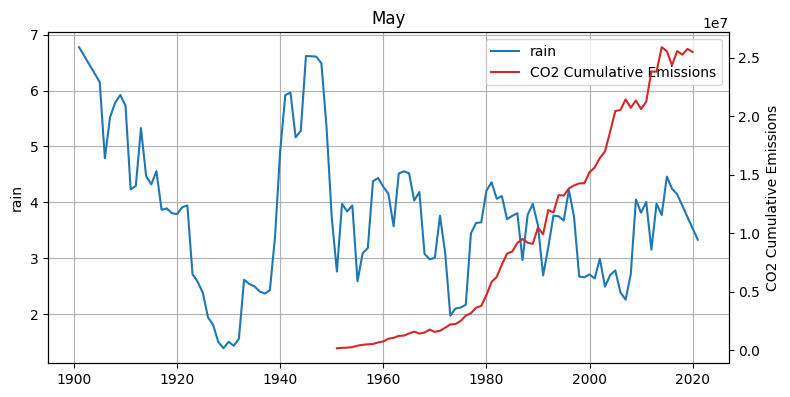

...

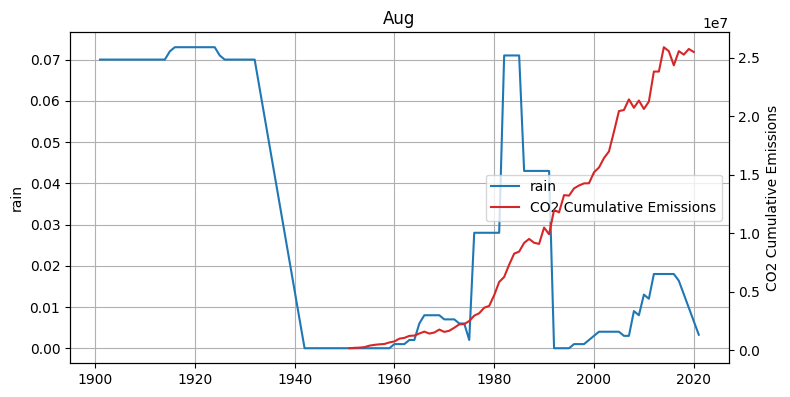

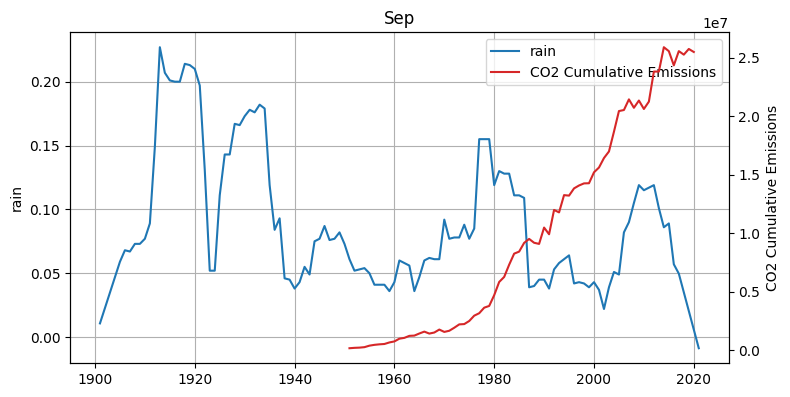

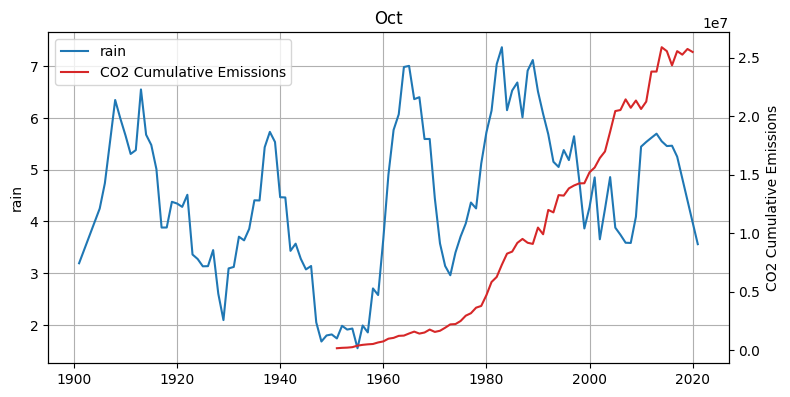

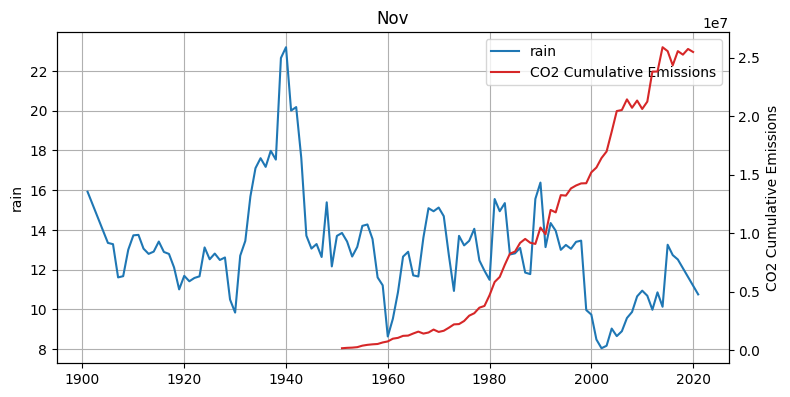

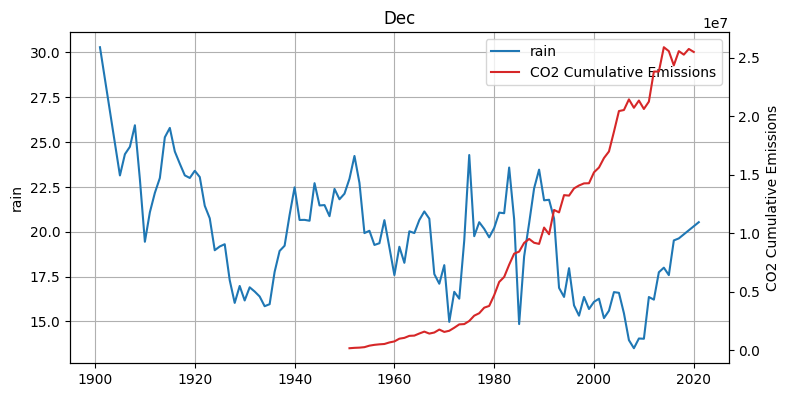

In [168]:
for wanted_month in monthss:    
    fig, ax1 = plt.subplots()
    fig.set_figwidth(8)
    fig.set_figheight(4)

    plot1=ax1.plot(rain_df['Year'],rain_df[wanted_month], color='tab:blue',label='rain')
    ax1.set_ylabel('rain')  
    plt.grid()

    ax2 = ax1.twinx()
    ax2.set_ylabel('CO2 Cumulative Emissions')  
    plot2=ax2.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:red',label='CO2 Cumulative Emissions')

    fig.tight_layout()
    plt.title(wanted_month)
    lns = plot1+plot2
    labs = [l.get_label() for l in lns]
    
    ax1.legend(lns, labs, loc=0)

    plt.show()

## Monthly Climatology of Temperature & rain for all years

In [169]:
mean_monthly_temp=df.drop('Year',axis=1).mean()
mean_monthly_rain=rain_df.drop('Year',axis=1).mean()


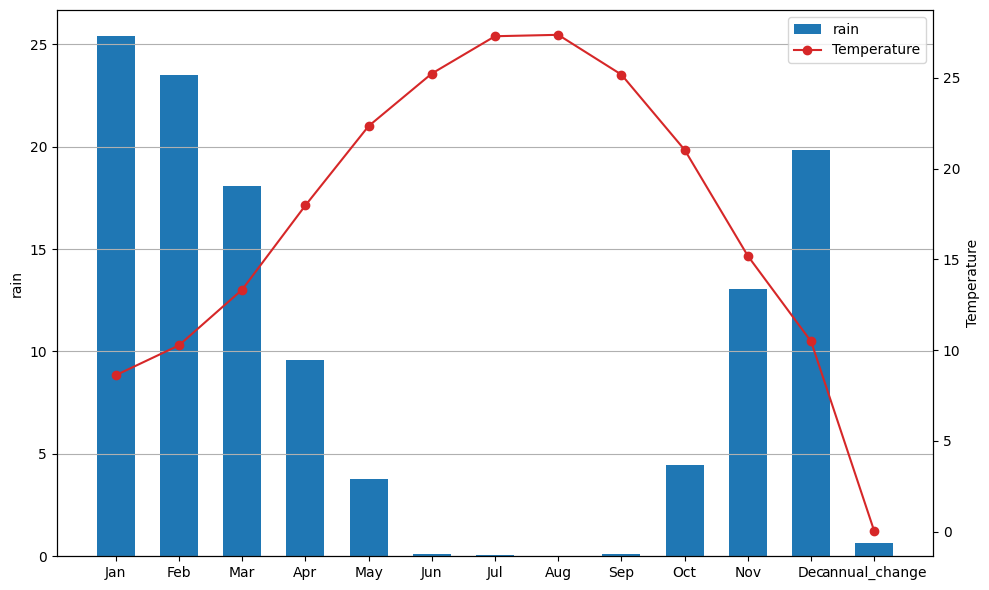

In [170]:
fig, ax1 = plt.subplots()
fig.set_figwidth(10)
fig.set_figheight(6)

plot1=ax1.bar(mean_monthly_rain.index,mean_monthly_rain, color='tab:blue',label="rain",width=0.6)
ax1.set_ylabel('rain')  

plt.grid(axis='y')

ax2 = ax1.twinx()
ax2.set_ylabel('Temperature')  
plot2=ax2.plot(mean_monthly_temp.index,mean_monthly_temp, color='tab:red',label='Temperature',marker='o')

lns = [plot1]+plot2
labs = [l.get_label() for l in lns]
ax1.legend(lns, labs, loc=0)
fig.tight_layout()
plt.show()

## Monthly Climatology of Temperature & rain for different time period


In [171]:
test=pd.DataFrame()
for month in monthss:
    fortest=take_range(df,month,20)
    test['Year']=fortest['year']
    test[month]=fortest['value']

test2=pd.DataFrame()
for month in monthss:
    fortest=take_range(rain_df,month,20)
    test2['Year']=fortest['year']
    test2[month]=fortest['value']

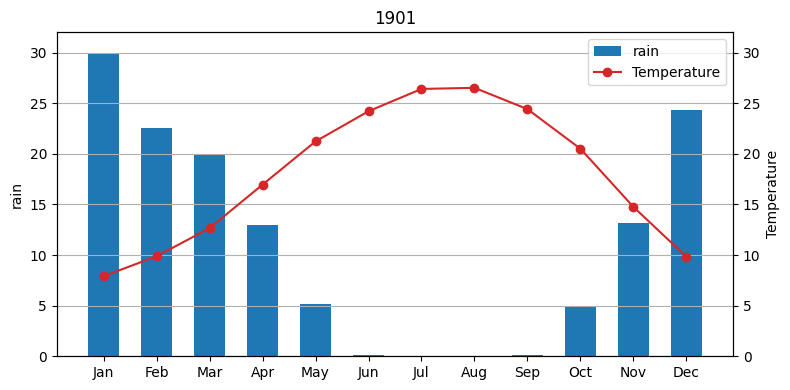

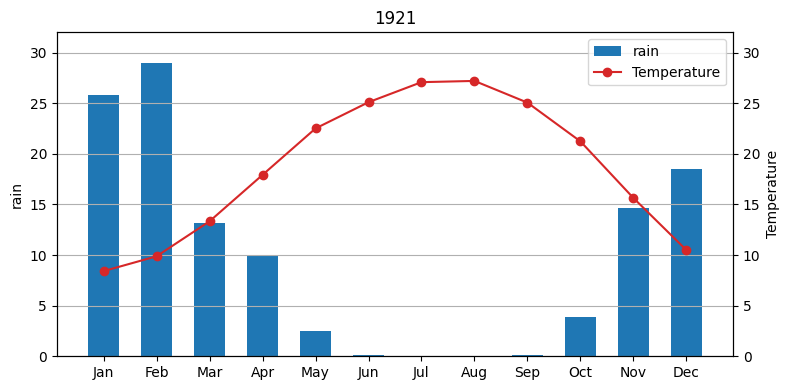

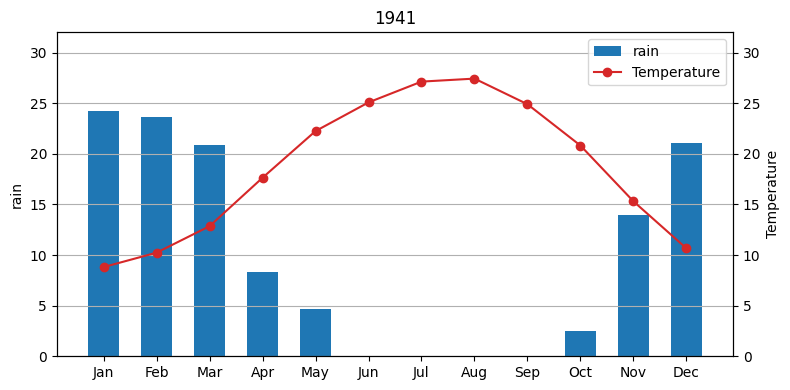

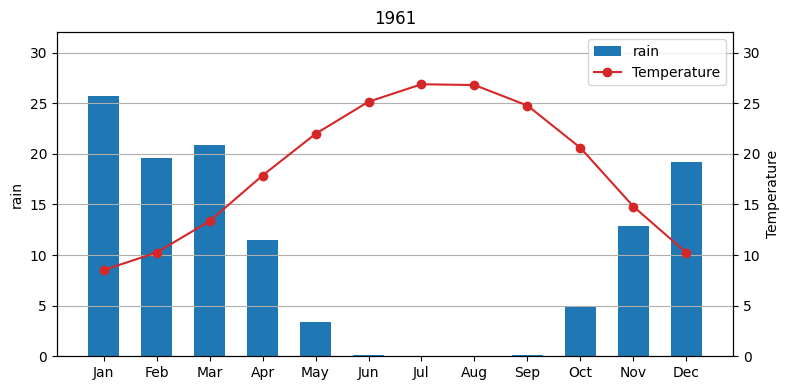

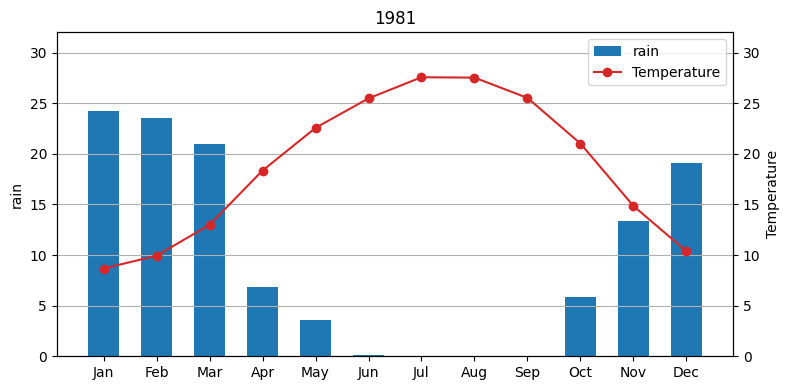

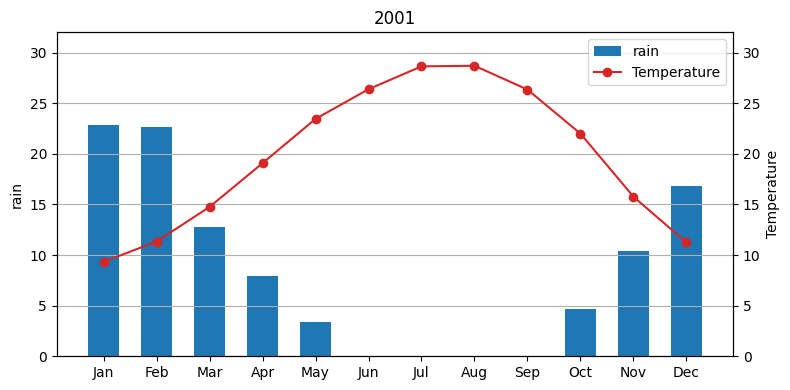

In [172]:
for i,year in zip(range(len(test)),test['Year']):
    fig, ax1 = plt.subplots()
    fig.set_figwidth(8)
    fig.set_figheight(4)
    data=test2[test2['Year']==year].drop('Year',axis=1).T
    plot1=ax1.bar(data.index,data[i], color='tab:blue',label="rain",width=0.6)
    ax1.set_title(year)
    ax1.set_ylabel('rain')  
    ax1.set_ylim(0,32)
    plt.grid(axis='y')

    ax2 = ax1.twinx()
    ax2.set_ylabel('Temperature')  
    data=test[test['Year']==year].drop('Year',axis=1).T
    plot2=ax2.plot(data.index,data[i], color='tab:red',label='Temperature',marker='o')
    ax2.set_ylim(0,32)
    
    lns = [plot1]+plot2
    labs = [l.get_label() for l in lns]
    ax1.legend(lns, labs, loc=0)
    fig.tight_layout()
    plt.show()


## CO2 Cumulative Emissions vs Electricity consumption

In [173]:
elec=pd.read_csv('Electricity consumption - Jordan.csv')
elec

,Year,Electricity consumption,Units
0,1990,3.33,TWh
1,1995,5.09,TWh
2,2000,6.61,TWh
3,2005,9.10,TWh
4,2010,13.40,TWh
5,2015,17.37,TWh
6,2020,18.93,TWh


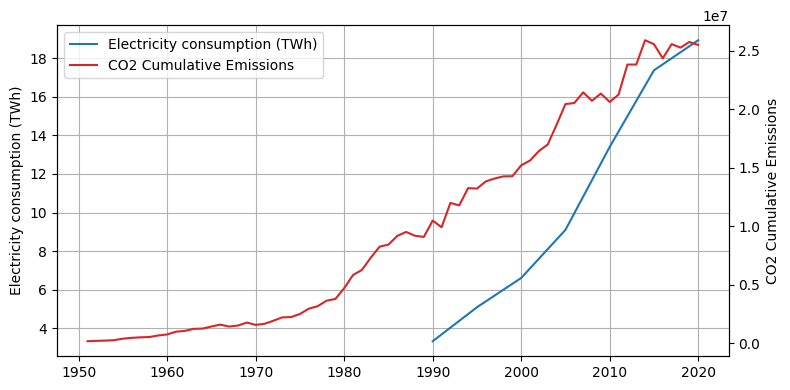

In [174]:
fig, ax1 = plt.subplots()
fig.set_figwidth(8)
fig.set_figheight(4)

plot1=ax1.plot(elec['Year'],elec['Electricity consumption'], color='tab:blue',label='Electricity consumption (TWh)')
ax1.set_ylabel('Electricity consumption (TWh)')  
plt.grid()

ax2 = ax1.twinx()
ax2.set_ylabel('CO2 Cumulative Emissions')  
plot2=ax2.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:red',label='CO2 Cumulative Emissions')

fig.tight_layout()
lns = plot1+plot2
labs = [l.get_label() for l in lns]

ax1.legend(lns, labs, loc=0)

plt.show()

In [175]:
elec_by_sector=pd.read_csv('Electricity consumption by sector - Jordan.csv')
elec_by_sector

,Year,Industry,Residential,Commercial and public services,Agriculture / forestry,Units
0,1990,4280,3146,1555,1962,TJ
1,1995,5731,5119,4043,3186,TJ
2,2000,6563,7132,4486,3564,TJ
3,2005,9018,11466,6559,4673,TJ
4,2010,11225,18810,9230,6725,TJ
5,2015,13338,26021,10022,8683,TJ
6,2020,15218,32760,10930,10319,TJ


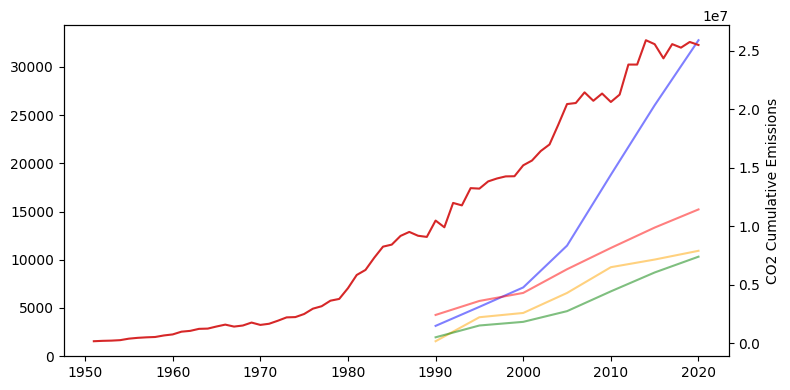

In [176]:
fig, ax1 = plt.subplots(figsize=(8,4))

ax1.plot(elec_by_sector['Year'],elec_by_sector['Residential'], color='blue', alpha=0.5)
ax1.plot(elec_by_sector['Year'],elec_by_sector['Industry'], color='red', alpha=0.5)
ax1.plot(elec_by_sector['Year'],elec_by_sector['Commercial and public services'], color='orange', alpha=0.5)
ax1.plot(elec_by_sector['Year'],elec_by_sector['Agriculture / forestry'], color='green', alpha=0.5)
ax2 = ax1.twinx()
ax2.set_ylabel('CO2 Cumulative Emissions')  
plot2=ax2.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:red',label='CO2 Cumulative Emissions (TWh)')

fig.tight_layout()

plt.show()

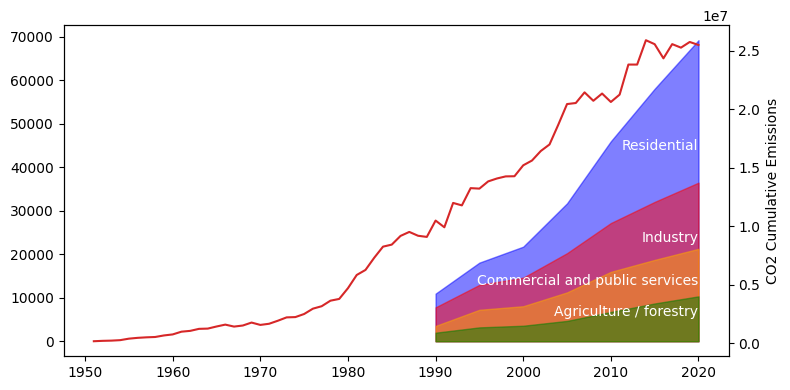

In [177]:
Residential_value=elec_by_sector['Residential']+elec_by_sector['Industry']+elec_by_sector['Commercial and public services']+elec_by_sector['Agriculture / forestry']
Industry_value= elec_by_sector['Industry']+elec_by_sector['Commercial and public services']+elec_by_sector['Agriculture / forestry']
Commercial_value =elec_by_sector['Commercial and public services']+elec_by_sector['Agriculture / forestry']
Agriculture_value=elec_by_sector['Agriculture / forestry']
fig, ax1 = plt.subplots(figsize=(8,4))

ax1.fill_between(elec_by_sector['Year'], 0,Residential_value , color='blue', alpha=0.5)
ax1.fill_between(elec_by_sector['Year'], 0, Industry_value, color='red', alpha=0.5)
ax1.fill_between(elec_by_sector['Year'], 0,Commercial_value, color='orange', alpha=0.5)
ax1.fill_between(elec_by_sector['Year'], 0, Agriculture_value, color='green', alpha=0.5)
for i,value in zip(['Industry','Residential','Commercial and public services','Agriculture / forestry'],[Industry_value,Residential_value,Commercial_value,Agriculture_value]):
    y_pos=max(value)*0.65
    x_pos=2020
    plt.text(x_pos, y_pos, i, ha='right',va='center', color='white')
ax2 = ax1.twinx()
ax2.set_ylabel('CO2 Cumulative Emissions')  
plot2=ax2.plot(co2_df['Year'],co2_df['co2_diff'], color='tab:red',label='CO2 Cumulative Emissions (TWh)')

fig.tight_layout()

plt.show()

# model building 

## prophet

In [178]:
from prophet import Prophet

In [179]:
co2_df['ds']=pd.to_datetime(co2_df['Year'],format='%Y')
co2_df['y']=co2_df['co2_diff']

In [180]:
train_size = int(co2_df.shape[0]*0.9)

train=co2_df.iloc[:train_size][['ds','y']]
test=co2_df.iloc[train_size:][['ds','y']]



In [181]:
from sklearn.base import BaseEstimator, RegressorMixin

class ProphetWrapper(BaseEstimator, RegressorMixin):
    def __init__(self, seasonality_prior_scale=10.0, seasonality_mode='additive', changepoint_prior_scale=0.05, holidays_prior_scale=10.0, n_changepoints=25):
        self.seasonality_prior_scale = seasonality_prior_scale
        self.seasonality_mode = seasonality_mode
        self.changepoint_prior_scale = changepoint_prior_scale
        self.holidays_prior_scale = holidays_prior_scale
        self.n_changepoints = n_changepoints
    
    def fit(self, X, y):
        self.model = Prophet(seasonality_prior_scale=self.seasonality_prior_scale, 
                             seasonality_mode=self.seasonality_mode, 
                             changepoint_prior_scale=self.changepoint_prior_scale,
                             holidays_prior_scale=self.holidays_prior_scale, 
                             n_changepoints=self.n_changepoints)
        df = X.to_frame().reset_index().rename(columns={'index': 'ds', X.name: 'y'})

        df['y'] = y
        self.model.fit(df)
        return self
    
    def predict(self, X):
        df = X.rename(columns={'ds': 'ds'})
        y_pred = self.model.predict(df)['yhat'].values
        return y_pred


In [182]:
param_grid = {
    'seasonality_prior_scale': [0.01, 0.1, 1.0],
    'seasonality_mode':('multiplicative','additive'),
    'changepoint_prior_scale':[0.1,0.2,0.3,0.4,0.5,0.001, 0.01],
    'holidays_prior_scale':[0.1,0.2,0.3,0.4,0.5],
    'n_changepoints' : [100,150,200]
}

In [183]:
model = ProphetWrapper()
grid_search = GridSearchCV(model, param_grid=param_grid, cv=3,scoring='neg_mean_squared_error')
grid_search.fit(train['ds'],train['y'])
print(grid_search.cv_results_)
best_params = grid_search.best_params_


ValueError: 
All the 1890 fits failed.
It is very likely that your model is misconfigured.
You can try to debug the error by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
630 fits failed with the following error:
Traceback (most recent call last):
  File "pandas\_libs\tslib.pyx", line 605, in pandas._libs.tslib.array_to_datetime
  File "pandas\_libs\tslibs\parsing.pyx", line 291, in pandas._libs.tslibs.parsing.parse_datetime_string
ValueError: Given date string 42 not likely a datetime

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "pandas\_libs\tslib.pyx", line 616, in pandas._libs.tslib.array_to_datetime
TypeError: invalid string coercion to datetime for "42" at position 0

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\LENOVO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\LENOVO\AppData\Local\Temp\ipykernel_15824\1356892051.py", line 20, in fit
    self.model.fit(df)
  File "C:\Users\LENOVO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\prophet\forecaster.py", line 1126, in fit
    history = self.setup_dataframe(history, initialize_scales=True)
  File "C:\Users\LENOVO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\prophet\forecaster.py", line 271, in setup_dataframe
    df['ds'] = pd.to_datetime(df['ds'])
  File "C:\Users\LENOVO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pandas\core\tools\datetimes.py", line 1068, in to_datetime
    values = convert_listlike(arg._values, format)
  File "C:\Users\LENOVO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pandas\core\tools\datetimes.py", line 438, in _convert_listlike_datetimes
    result, tz_parsed = objects_to_datetime64ns(
  File "C:\Users\LENOVO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pandas\core\arrays\datetimes.py", line 2177, in objects_to_datetime64ns
    result, tz_parsed = tslib.array_to_datetime(
  File "pandas\_libs\tslib.pyx", line 427, in pandas._libs.tslib.array_to_datetime
  File "pandas\_libs\tslib.pyx", line 683, in pandas._libs.tslib.array_to_datetime
  File "pandas\_libs\tslib.pyx", line 829, in pandas._libs.tslib._array_to_datetime_object
  File "pandas\_libs\tslib.pyx", line 819, in pandas._libs.tslib._array_to_datetime_object
  File "pandas\_libs\tslibs\parsing.pyx", line 291, in pandas._libs.tslibs.parsing.parse_datetime_string
ValueError: Given date string 42 not likely a datetime present at position 0

--------------------------------------------------------------------------------
1260 fits failed with the following error:
Traceback (most recent call last):
  File "pandas\_libs\tslib.pyx", line 605, in pandas._libs.tslib.array_to_datetime
  File "pandas\_libs\tslibs\parsing.pyx", line 291, in pandas._libs.tslibs.parsing.parse_datetime_string
ValueError: Given date string 1 not likely a datetime

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "pandas\_libs\tslib.pyx", line 616, in pandas._libs.tslib.array_to_datetime
TypeError: invalid string coercion to datetime for "1" at position 0

During handling of the above exception, another exception occurred:

Traceback (most recent call last):
  File "C:\Users\LENOVO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\sklearn\model_selection\_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "C:\Users\LENOVO\AppData\Local\Temp\ipykernel_15824\1356892051.py", line 20, in fit
    self.model.fit(df)
  File "C:\Users\LENOVO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\prophet\forecaster.py", line 1126, in fit
    history = self.setup_dataframe(history, initialize_scales=True)
  File "C:\Users\LENOVO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\prophet\forecaster.py", line 271, in setup_dataframe
    df['ds'] = pd.to_datetime(df['ds'])
  File "C:\Users\LENOVO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pandas\core\tools\datetimes.py", line 1068, in to_datetime
    values = convert_listlike(arg._values, format)
  File "C:\Users\LENOVO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pandas\core\tools\datetimes.py", line 438, in _convert_listlike_datetimes
    result, tz_parsed = objects_to_datetime64ns(
  File "C:\Users\LENOVO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\pandas\core\arrays\datetimes.py", line 2177, in objects_to_datetime64ns
    result, tz_parsed = tslib.array_to_datetime(
  File "pandas\_libs\tslib.pyx", line 427, in pandas._libs.tslib.array_to_datetime
  File "pandas\_libs\tslib.pyx", line 683, in pandas._libs.tslib.array_to_datetime
  File "pandas\_libs\tslib.pyx", line 829, in pandas._libs.tslib._array_to_datetime_object
  File "pandas\_libs\tslib.pyx", line 819, in pandas._libs.tslib._array_to_datetime_object
  File "pandas\_libs\tslibs\parsing.pyx", line 291, in pandas._libs.tslibs.parsing.parse_datetime_string
ValueError: Given date string 1 not likely a datetime present at position 0


In [ ]:
model = Prophet(changepoint_prior_scale=1, seasonality_prior_scale=5)
model.fit(train)
y_pred=model.predict(test)

11:57:06 - cmdstanpy - INFO - Chain [1] start processing
11:57:06 - cmdstanpy - INFO - Chain [1] done processing


In [ ]:
model.component_modes

{'additive': ['yearly',
  'additive_terms',
  'extra_regressors_additive',
  'holidays'],
 'multiplicative': ['multiplicative_terms', 'extra_regressors_multiplicative']}

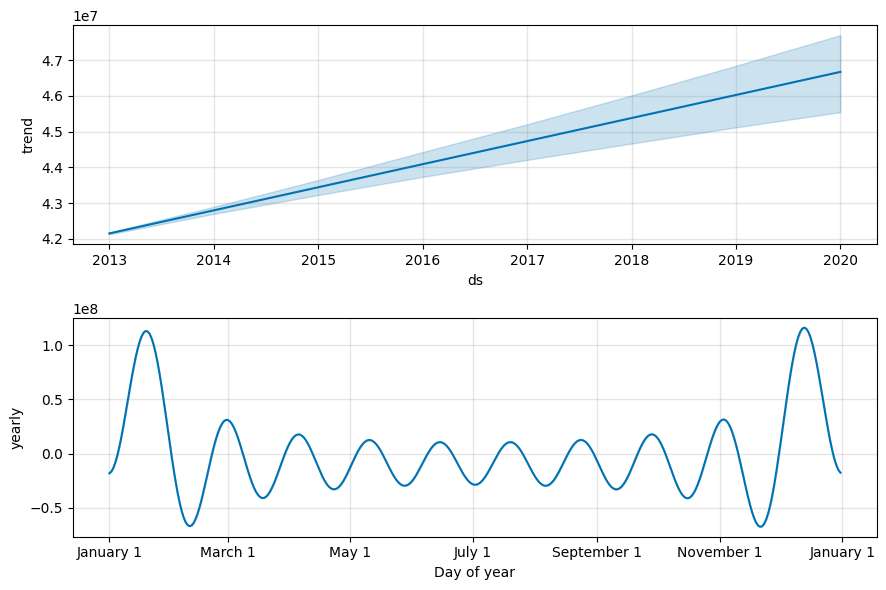

In [ ]:
model.plot_components(y_pred);

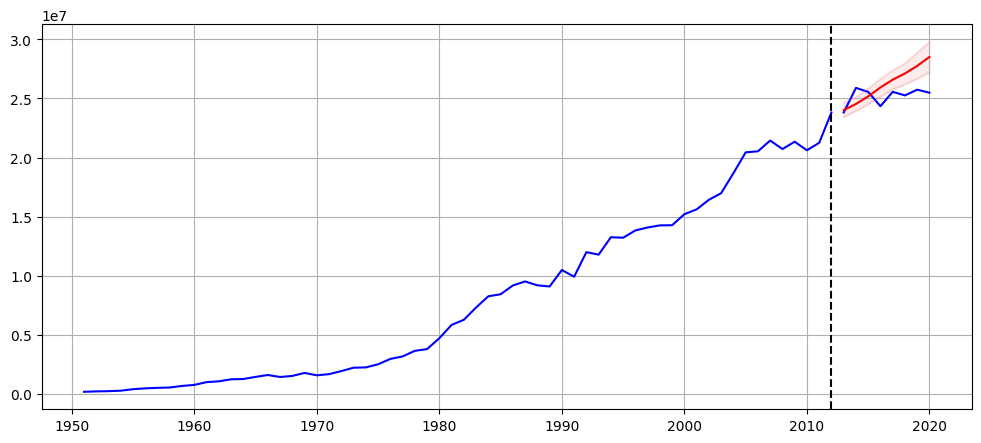

In [ ]:
fig,ax1=plt.subplots(figsize=(12,5))
ax1.plot(train['ds'],train['y'],c='b')
ax1.plot(test['ds'],test['y'],c='b')
ax1.plot(y_pred['ds'],y_pred['yhat'],c='r')
ax1.axvline(max(train['ds']),ls='--',c='k')
plt.fill_between(y_pred['ds'], y_pred['yhat_lower'], y_pred['yhat_upper'], alpha=0.15,color='lightcoral')

ax1.plot(y_pred['ds'], y_pred['yhat_lower'], color='lightcoral', alpha=0.2)
ax1.plot(y_pred['ds'], y_pred['yhat_upper'], color='lightcoral', alpha=0.2)
ax1.grid()

In [ ]:
mse = mean_squared_error(test['y'], y_pred['yhat'])
rmse = np.sqrt(mse)
mae = mean_absolute_error(test['y'], y_pred['yhat'])
r2=r2_score(test['y'], y_pred['yhat'])
print('RMSE:', rmse)
print('MAE:', mae)
print('r2S:', r2)


RMSE: 1669761.869659231
MAE: 1431464.4868406309
r2S: -4.906288274581466


## XGBoost

In [ ]:
from xgboost import XGBRFRegressor as xgb
# form xgboost import

C:\Users\LENOVO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\xgboost\compat.py:36: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  from pandas import MultiIndex, Int64Index


### train test split

In [ ]:
train_size = int(co2_df.shape[0]*0.80)
train=co2_df.iloc[:train_size]
test=co2_df.iloc[train_size:]
X_train=train[['Year']]
y_train=train['co2_diff'].fillna(0)
X_test=test[['Year']]
y_test=test['co2_diff'].fillna(0)


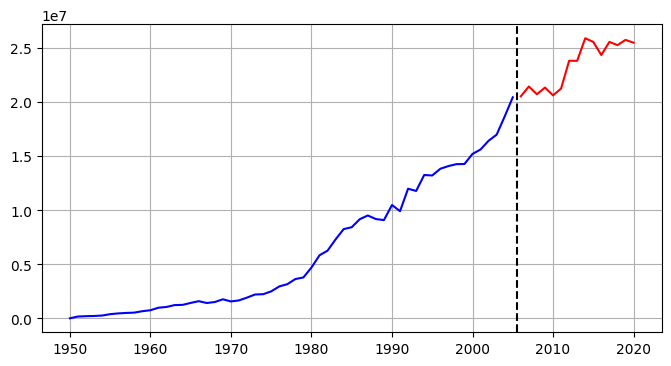

In [ ]:
fig,ax1=plt.subplots(figsize=(8,4))
ax1.plot(X_train,y_train,c='b')
ax1.plot(X_test,y_test,c='r')
ax1.axvline(2005.5,ls='--',c='k')
ax1.grid()

### data scaling 

In [ ]:
# scaler = RobustScaler()

# X_train = scaler.fit_transform(X_train,y_train)
# X_test = scaler.transform(X_test)

### creating model


In [ ]:
# early_stopping_rounds=50,
model=xgb(n_estimators=1000,learning_rate=0.0001,objective='reg:squarederror',early_stopping_rounds=50)
model.fit(X_train,y_train,eval_set=[(X_train,y_train),(X_test,y_test)],verbose=True)
y_pred=model.predict(X_test)

C:\Users\LENOVO\AppData\Local\Packages\PythonSoftwareFoundation.Python.3.10_qbz5n2kfra8p0\LocalCache\local-packages\Python310\site-packages\xgboost\data.py:250: FutureWarning: pandas.Int64Index is deprecated and will be removed from pandas in a future version. Use pandas.Index with the appropriate dtype instead.
  elif isinstance(data.columns, (pd.Int64Index, pd.RangeIndex)):


[12:27:54] WARNING: C:/Users/Administrator/workspace/xgboost-win64_release_1.5.0/src/learner.cc:576: 
Parameters: { "early_stopping_rounds" } might not be used.

  This could be a false alarm, with some parameters getting used by language bindings but
  then being mistakenly passed down to XGBoost core, or some parameter actually being used
  but getting flagged wrongly here. Please open an issue if you find any such cases.


[0]	validation_0-rmse:8610965.00000	validation_1-rmse:23515404.00000


In [ ]:
y_pred = model.predict(X_test)
mse = mean_squared_error(y_test, y_pred)
rmse = np.sqrt(mse)
mae = mean_absolute_error(y_test, y_pred)
r2=r2_score(y_test, y_pred)
print('RMSE:', rmse)
print('MAE:', mae)
print('r2S:', r2)


RMSE: 23515404.474764135
MAE: 23421583.65970866
r2S: -124.57132783403955


In [ ]:
# model.get_booster().get_dump()

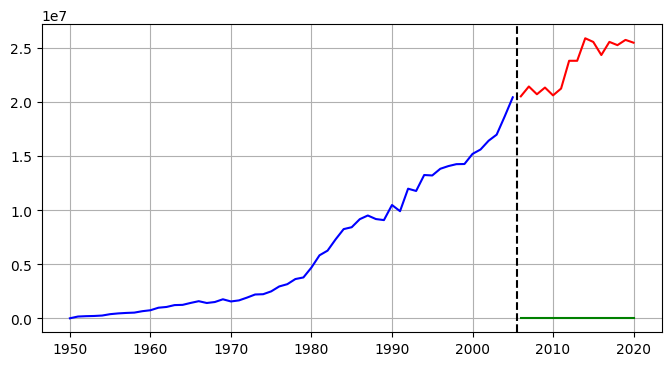

In [ ]:
fig,ax1=plt.subplots(figsize=(8,4))
ax1.plot(X_train,y_train,c='b')
ax1.plot(X_test,y_test,c='r')
ax1.plot(X_test,y_pred,c='g')
ax1.axvline(2005.5,ls='--',c='k')
ax1.grid()

## predicting temps